# **EDA Project**

**Group Members:**
1. **Parjanya Rajput - 202201115**
2. **Ayush Popshetwar - 202201412**
3. **Vats Shah - 202201417**

**Topic: Meteorology**

**Course: Exploratory Data Analysis - IT462**

**Prof: Gopinath Panda**


**Colab File Link:**

https://colab.research.google.com/drive/129gKSodihKqVet7WdYngNGRtVvr70ItU?usp=sharing

In [ ]:
# Importing Libraries
import pandas as pd
import requests
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import missingno as msno
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import joblib
warnings.filterwarnings('ignore')

In [105]:
# Load the data
data = pd.read_csv("https://raw.githubusercontent.com/parjanya-rajput/EDA_Group7_Meteorology/main/Group7_Meteorology.csv")
data

,DateTime,H,H_unc,LE,LE_unc,Tau,Tau_unc,NEE,NEE_unc,CO2_strg,...,TKE,Tstar,L,zL,x_peak,x_10,x_30,x_50,x_70,x_90
0,2016-01-01 00:30:00,-2.2885,0.7214,-9999.0000,-9999.0000,0.0024,0.0007,-9999.0000,-9999.0000,-9999.0000,...,0.083819,-0.0426,3.2390,1.2164,19.0008,18,37,70,153,680
1,2016-01-01 01:00:00,-9999.0000,0.1559,-9999.0000,-9999.0000,0.0014,0.0007,-9999.0000,-9999.0000,-9999.0000,...,0.068601,-0.0046,17.3392,0.2272,32.4723,31,66,128,293,1426
2,2016-01-01 01:30:00,-1.8888,0.7057,-9999.0000,-9999.0000,0.0053,0.0014,-9999.0000,-9999.0000,-9999.0000,...,0.183427,-0.0236,12.9352,0.3046,23.3083,22,47,92,209,1011
3,2016-01-01 02:00:00,-0.7832,0.7173,-9999.0000,-9999.0000,0.0027,0.0003,-9999.0000,-9999.0000,-9999.0000,...,0.034370,-0.0141,10.4076,0.3786,2.5793,2,5,9,19,75
4,2016-01-01 02:30:00,-9999.0000,1.3465,-9999.0000,-9999.0000,0.0082,0.0015,-9999.0000,-9999.0000,-9999.0000,...,0.095324,-0.0541,8.5963,0.4583,6.6706,6,13,24,52,227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35083,2017-12-31 22:00:00,9.2179,1.7711,-9999.0000,6.0348,0.0552,0.0138,-9999.0000,-9999.0000,-9999.0000,...,0.350094,0.0371,-85.9758,-0.0470,2.8861,2,4,8,14,42
35084,2017-12-31 22:30:00,-0.5630,0.9474,1.9641,7.5107,0.0120,0.0030,0.0706,0.2330,-0.2525,...,0.053490,-0.0050,127.8490,0.0316,0.4441,1,1,2,8,-9999
35085,2017-12-31 23:00:00,2.6791,0.6997,-9999.0000,3.2319,0.0206,0.0039,1.7248,0.2682,-0.0371,...,0.162838,0.0174,-69.4188,-0.0582,14.2709,12,21,35,63,178
35086,2017-12-31 23:30:00,-9999.0000,0.5120,-9999.0000,9.5268,0.0274,0.0040,-9999.0000,-9999.0000,-9999.0000,...,0.136635,0.0199,-80.4828,-0.0502,13.3969,11,20,33,60,174


In [ ]:
data.shape

(35088, 44)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35088 entries, 0 to 35087
Data columns (total 44 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   DateTime       35088 non-null  object 
 1   H              35088 non-null  float64
 2   H_unc          35088 non-null  float64
 3   LE             35088 non-null  float64
 4   LE_unc         35088 non-null  float64
 5   Tau            35088 non-null  float64
 6   Tau_unc        35088 non-null  float64
 7   NEE            35088 non-null  float64
 8   NEE_unc        35088 non-null  float64
 9   CO2_strg       35088 non-null  float64
 10  Pa             35088 non-null  float64
 11  Ta             35088 non-null  float64
 12  RH             35088 non-null  float64
 13  SWin           35088 non-null  float64
 14  SWout          35088 non-null  float64
 15  LWin           35088 non-null  float64
 16  LWout          35088 non-null  float64
 17  Rnet           35088 non-null  float64
 18  G1    

In [ ]:
# Transform 'DateTime' column to timestamp
data['DateTime'] = pd.to_datetime(data['DateTime'])

In [ ]:
data.describe() # Get statistical information about the data

,DateTime,H,H_unc,LE,LE_unc,Tau,Tau_unc,NEE,NEE_unc,CO2_strg,...,TKE,Tstar,L,zL,x_peak,x_10,x_30,x_50,x_70,x_90
count,35088,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,...,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000
mean,2016-12-31 12:15:00,-2274.467463,-1051.165419,-4579.673662,-2212.388262,-1054.049990,-1054.095192,-4693.835270,-4690.827987,-4724.854619,...,-1053.733050,-1054.041007,-1058.508392,-1053.360213,-1019.867407,-1042.464090,-1035.138480,-996.519779,-901.499373,-498.615054
min,2016-01-01 00:30:00,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,...,-9999.000000,-9999.000000,-842052.400000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000
25%,2016-07-01 18:22:30,-37.551850,0.381200,-9999.000000,0.167250,0.001600,0.000300,-9999.000000,-9999.000000,-9999.000000,...,0.023881,-0.080100,-39.451825,-0.399175,11.419900,9.000000,17.000000,26.000000,45.000000,102.000000
50%,2016-12-31 12:15:00,-3.356050,1.124250,-1.166200,1.865600,0.018000,0.002900,-31.255250,0.190850,-1.645700,...,0.142759,-0.017200,-1.391300,-0.016500,22.003500,19.000000,36.000000,61.000000,114.000000,332.000000
75%,2017-07-02 06:07:30,18.999175,3.517950,50.775325,9.251275,0.072700,0.009600,0.552675,0.895725,-0.019000,...,0.530085,0.081900,11.261400,0.278400,34.296350,30.000000,59.000000,108.000000,227.000000,886.000000
max,2018-01-01 00:00:00,384.834600,352.249800,794.017600,464.591700,2.783200,0.236900,20.953000,33.230000,35.811700,...,23.460813,3.935100,463376.300000,6847.359000,11560.330000,5605.000000,5084.000000,9662.000000,9793.000000,9998.000000
std,NaN,4216.648596,3071.694830,5037.148685,4159.690308,3070.701013,3070.685495,4987.836464,4990.654808,4991.956765,...,3070.809861,3070.704103,6486.969790,3071.232569,3084.433223,3106.966056,3150.278494,3195.636527,3310.817636,3958.138433


**Whole statistical data is false due to -9999 values in the dataset. So we will treat it as missing value**

In [ ]:
df = data.drop(['DateTime'], axis=1)
#Only apply the mask to numerical columns
numeric_df = df.select_dtypes(include=np.number)
df[numeric_df.columns] = numeric_df.mask((numeric_df > 9000.0000) | (numeric_df < -9000.0000), np.nan)
df['DateTime'] = data['DateTime']

In [ ]:
df.isnull().sum()

,0
H,8054
H_unc,3699
LE,16260
LE_unc,7790
Tau,3699
Tau_unc,3699
NEE,16463
NEE_unc,16463
CO2_strg,16580
Pa,2616


In [ ]:
# Calculate percentage of missing values
percent_missing = df.isnull().sum() * 100 / len(df)
percent_missing

,0
H,22.953716
H_unc,10.542066
LE,46.340629
LE_unc,22.201322
Tau,10.542066
Tau_unc,10.542066
NEE,46.919175
NEE_unc,46.919175
CO2_strg,47.252622
Pa,7.455540


In [ ]:
# Calculate total percentage of missing data
total_missing_percent = df.isnull().sum().sum() * 100 / df.size

# Display the result
print(f"Total percentage of missing data: {total_missing_percent:.2f}%")

Total percentage of missing data: 15.69%


<Axes: >

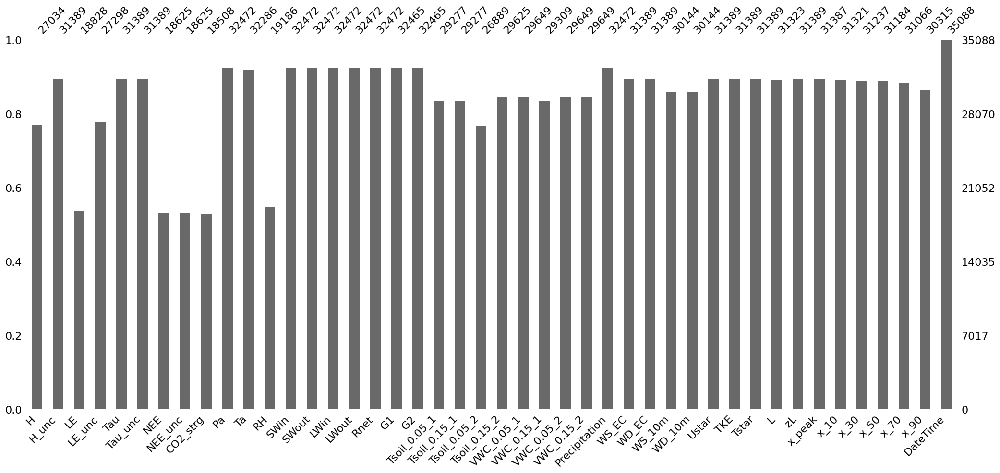

In [ ]:
msno.bar(df)

<Axes: >

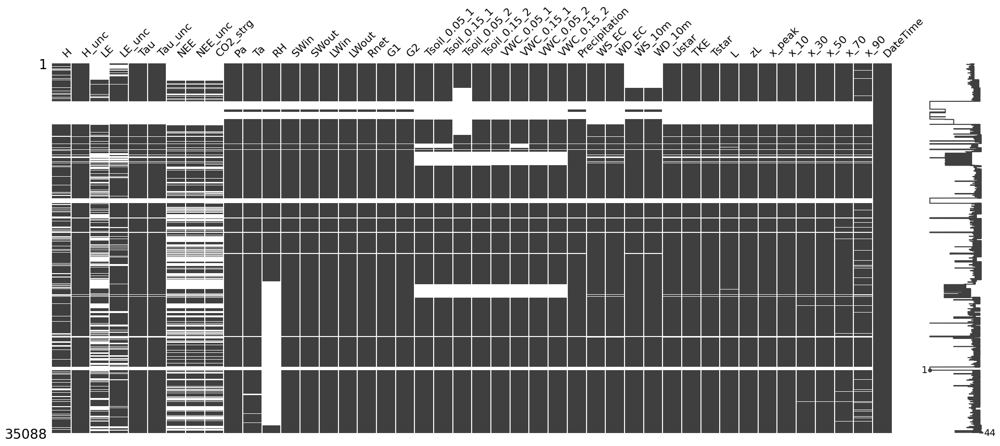

In [ ]:
msno.matrix(df)

<Axes: >

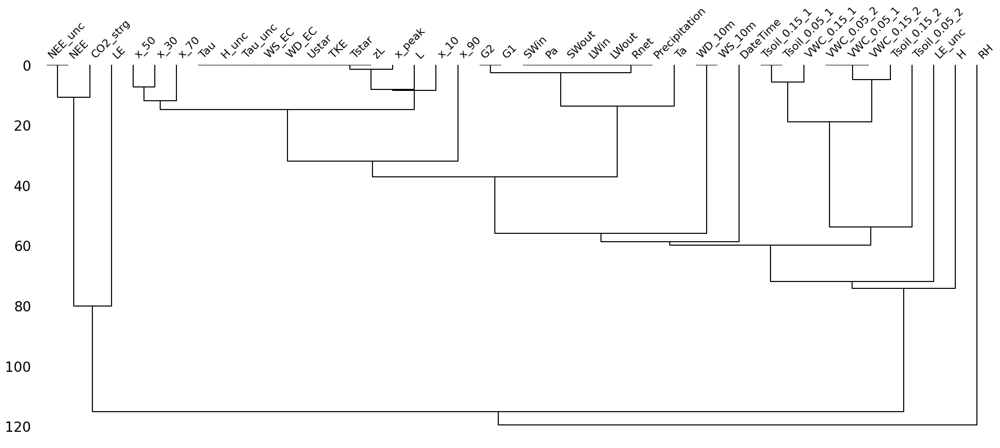

In [ ]:
msno.dendrogram(df)

**As we have around 15% of data missing so we will impute the values using Backward Fill method.**

**Why Backward Fill?**
**As the data is timely ordered we assume that values don't change drastically in short duration of time**


In [ ]:
# Fill missing values using backward fill
df = df.fillna(method='bfill')
df

,H,H_unc,LE,LE_unc,Tau,Tau_unc,NEE,NEE_unc,CO2_strg,Pa,...,Tstar,L,zL,x_peak,x_10,x_30,x_50,x_70,x_90,DateTime
0,-2.2885,0.7214,150.5684,18.8912,0.0024,0.0007,-3.3463,0.9495,-0.0115,100.4467,...,-0.0426,3.2390,1.2164,19.0008,18.0,37.0,70.0,153.0,680.0,2016-01-01 00:30:00
1,-1.8888,0.1559,150.5684,18.8912,0.0014,0.0007,-3.3463,0.9495,-0.0115,100.4333,...,-0.0046,17.3392,0.2272,32.4723,31.0,66.0,128.0,293.0,1426.0,2016-01-01 01:00:00
2,-1.8888,0.7057,150.5684,18.8912,0.0053,0.0014,-3.3463,0.9495,-0.0115,100.5000,...,-0.0236,12.9352,0.3046,23.3083,22.0,47.0,92.0,209.0,1011.0,2016-01-01 01:30:00
3,-0.7832,0.7173,150.5684,18.8912,0.0027,0.0003,-3.3463,0.9495,-0.0115,100.5000,...,-0.0141,10.4076,0.3786,2.5793,2.0,5.0,9.0,19.0,75.0,2016-01-01 02:00:00
4,-2.1277,1.3465,150.5684,18.8912,0.0082,0.0015,-3.3463,0.9495,-0.0115,100.4967,...,-0.0541,8.5963,0.4583,6.6706,6.0,13.0,24.0,52.0,227.0,2016-01-01 02:30:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35083,9.2179,1.7711,1.9641,6.0348,0.0552,0.0138,0.0706,0.2330,-0.2525,100.0667,...,0.0371,-85.9758,-0.0470,2.8861,2.0,4.0,8.0,14.0,42.0,2017-12-31 22:00:00
35084,-0.5630,0.9474,1.9641,7.5107,0.0120,0.0030,0.0706,0.2330,-0.2525,100.1000,...,-0.0050,127.8490,0.0316,0.4441,1.0,1.0,2.0,8.0,178.0,2017-12-31 22:30:00
35085,2.6791,0.6997,NaN,3.2319,0.0206,0.0039,1.7248,0.2682,-0.0371,100.0333,...,0.0174,-69.4188,-0.0582,14.2709,12.0,21.0,35.0,63.0,178.0,2017-12-31 23:00:00
35086,NaN,0.5120,NaN,9.5268,0.0274,0.0040,NaN,NaN,NaN,100.0367,...,0.0199,-80.4828,-0.0502,13.3969,11.0,20.0,33.0,60.0,174.0,2017-12-31 23:30:00


In [ ]:
# Calculate total percentage of missing data
total_missing_percent = df.isnull().sum().sum() * 100 / df.size

# Display the result
print(f"Total percentage of missing data: {total_missing_percent:.6f}%")

Total percentage of missing data: 0.000712%


In [ ]:
# Fill left over missing values using forward fill
df = df.fillna(method='ffill')
df

,H,H_unc,LE,LE_unc,Tau,Tau_unc,NEE,NEE_unc,CO2_strg,Pa,...,Tstar,L,zL,x_peak,x_10,x_30,x_50,x_70,x_90,DateTime
0,-2.2885,0.7214,150.5684,18.8912,0.0024,0.0007,-3.3463,0.9495,-0.0115,100.4467,...,-0.0426,3.2390,1.2164,19.0008,18.0,37.0,70.0,153.0,680.0,2016-01-01 00:30:00
1,-1.8888,0.1559,150.5684,18.8912,0.0014,0.0007,-3.3463,0.9495,-0.0115,100.4333,...,-0.0046,17.3392,0.2272,32.4723,31.0,66.0,128.0,293.0,1426.0,2016-01-01 01:00:00
2,-1.8888,0.7057,150.5684,18.8912,0.0053,0.0014,-3.3463,0.9495,-0.0115,100.5000,...,-0.0236,12.9352,0.3046,23.3083,22.0,47.0,92.0,209.0,1011.0,2016-01-01 01:30:00
3,-0.7832,0.7173,150.5684,18.8912,0.0027,0.0003,-3.3463,0.9495,-0.0115,100.5000,...,-0.0141,10.4076,0.3786,2.5793,2.0,5.0,9.0,19.0,75.0,2016-01-01 02:00:00
4,-2.1277,1.3465,150.5684,18.8912,0.0082,0.0015,-3.3463,0.9495,-0.0115,100.4967,...,-0.0541,8.5963,0.4583,6.6706,6.0,13.0,24.0,52.0,227.0,2016-01-01 02:30:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35083,9.2179,1.7711,1.9641,6.0348,0.0552,0.0138,0.0706,0.2330,-0.2525,100.0667,...,0.0371,-85.9758,-0.0470,2.8861,2.0,4.0,8.0,14.0,42.0,2017-12-31 22:00:00
35084,-0.5630,0.9474,1.9641,7.5107,0.0120,0.0030,0.0706,0.2330,-0.2525,100.1000,...,-0.0050,127.8490,0.0316,0.4441,1.0,1.0,2.0,8.0,178.0,2017-12-31 22:30:00
35085,2.6791,0.6997,1.9641,3.2319,0.0206,0.0039,1.7248,0.2682,-0.0371,100.0333,...,0.0174,-69.4188,-0.0582,14.2709,12.0,21.0,35.0,63.0,178.0,2017-12-31 23:00:00
35086,2.6791,0.5120,1.9641,9.5268,0.0274,0.0040,1.7248,0.2682,-0.0371,100.0367,...,0.0199,-80.4828,-0.0502,13.3969,11.0,20.0,33.0,60.0,174.0,2017-12-31 23:30:00


In [ ]:
# Calculate total percentage of missing data
total_missing_percent = df.isnull().sum().sum() * 100 / df.size

# Display the result
print(f"Total percentage of missing data: {total_missing_percent:.6f}%")

Total percentage of missing data: 0.000000%


In [ ]:
df.describe()

,H,H_unc,LE,LE_unc,Tau,Tau_unc,NEE,NEE_unc,CO2_strg,Pa,...,Tstar,L,zL,x_peak,x_10,x_30,x_50,x_70,x_90,DateTime
count,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,...,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088
mean,18.167776,3.154424,87.585952,11.649759,0.061638,0.007102,-2.402739,1.159530,-0.220842,99.339105,...,0.052155,6.162013,0.728696,37.789113,34.349521,69.097156,128.124715,270.615937,969.317715,2016-12-31 12:15:00
min,-139.084300,0.002000,-88.019000,0.001800,0.000000,0.000000,-72.650700,0.002100,-39.907800,98.000000,...,-1.261300,-8986.233000,-367.727900,0.000200,1.000000,1.000000,2.000000,3.000000,7.000000,2016-01-01 00:30:00
25%,-10.107300,0.582875,5.697600,1.428300,0.004100,0.000800,-5.101250,0.448300,-0.340700,98.780000,...,-0.071200,-14.357325,-0.146700,16.739425,14.000000,25.000000,41.000000,72.000000,188.000000,2016-07-01 18:22:30
50%,-0.993050,1.549150,44.814950,5.293200,0.031600,0.004900,0.835100,0.792950,-0.030300,99.203300,...,-0.015100,2.166800,0.041200,25.036350,22.000000,42.000000,72.000000,142.000000,496.000000,2016-12-31 12:15:00
75%,22.590975,3.549950,140.420500,12.549700,0.101600,0.012300,3.432900,1.320100,0.245900,99.908600,...,0.085100,31.169200,0.297625,37.066100,34.000000,68.000000,125.000000,264.000000,1070.000000,2017-07-02 06:07:30
max,384.834600,352.249800,794.017600,464.591700,2.783200,0.236900,20.953000,33.230000,35.811700,100.920000,...,3.935100,8844.884000,6847.359000,6440.347000,5605.000000,5084.000000,8141.000000,8780.000000,8998.000000,2018-01-01 00:00:00
std,59.914014,4.751439,111.126810,23.848383,0.080077,0.007682,10.830005,1.559649,2.720159,0.673760,...,0.214160,376.757790,42.553595,75.457917,70.222147,134.962277,258.082094,503.091579,1359.170860,NaN


**We will use the unique values data to determine which columns have more duplicate data**

**Also we can see find which columns are sparse**

In [ ]:
df.nunique() #Get unique values

,0
H,26451
H_unc,23369
LE,18636
LE_unc,24170
Tau,3135
Tau_unc,485
NEE,18048
NEE_unc,12931
CO2_strg,11899
Pa,1176


Number of outliers in H: 5081


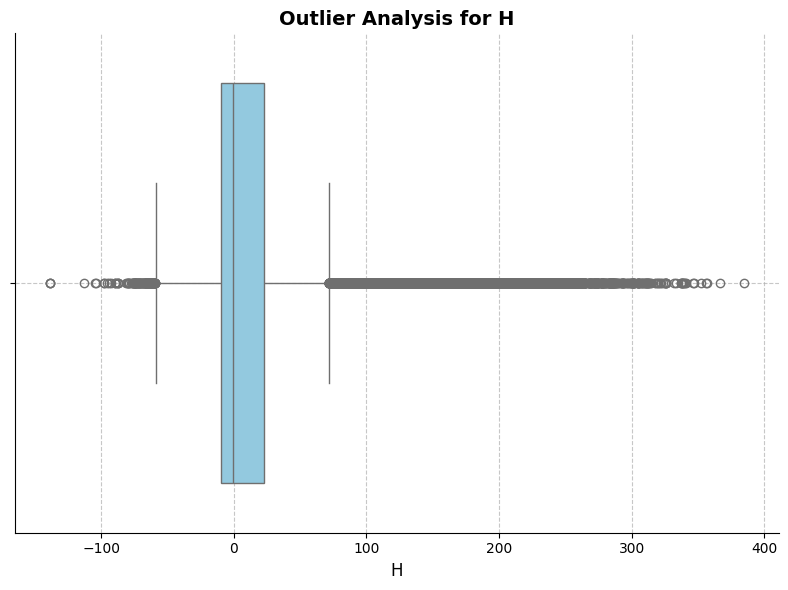

Number of outliers in H_unc: 4072


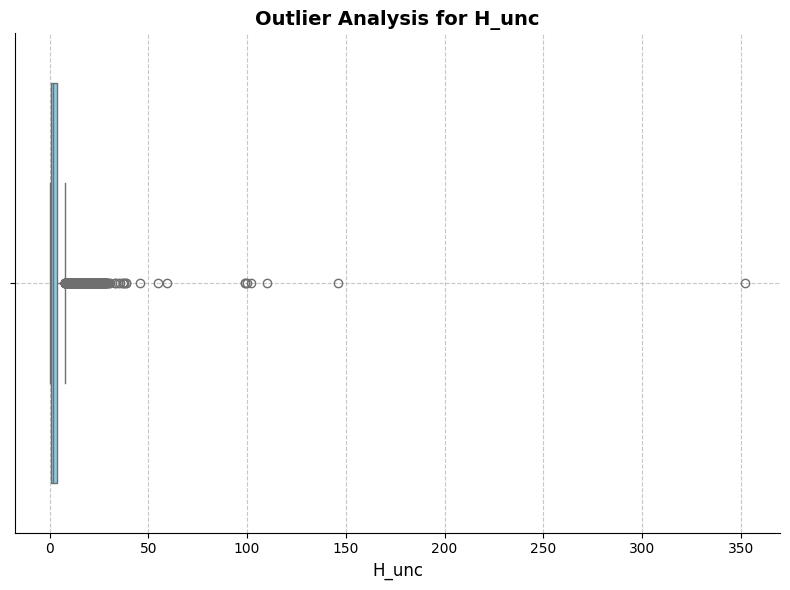

Number of outliers in LE: 1750


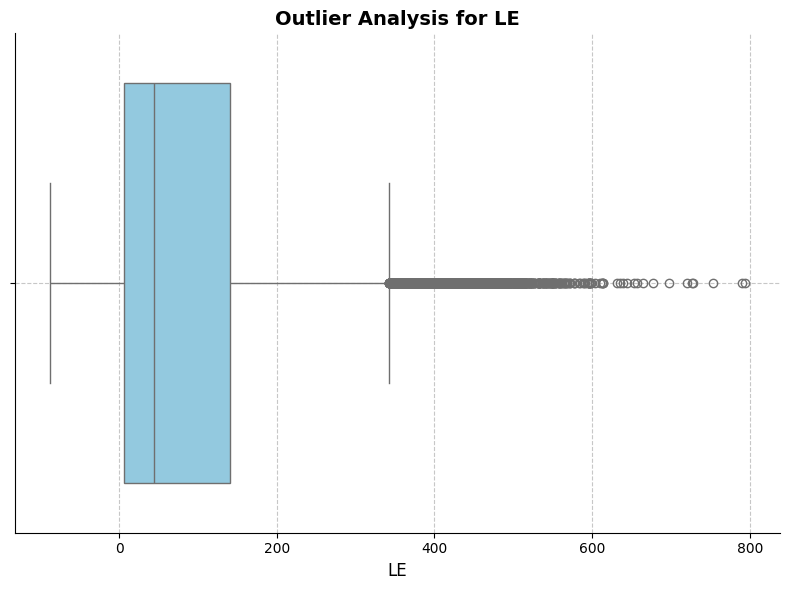

Number of outliers in LE_unc: 2812


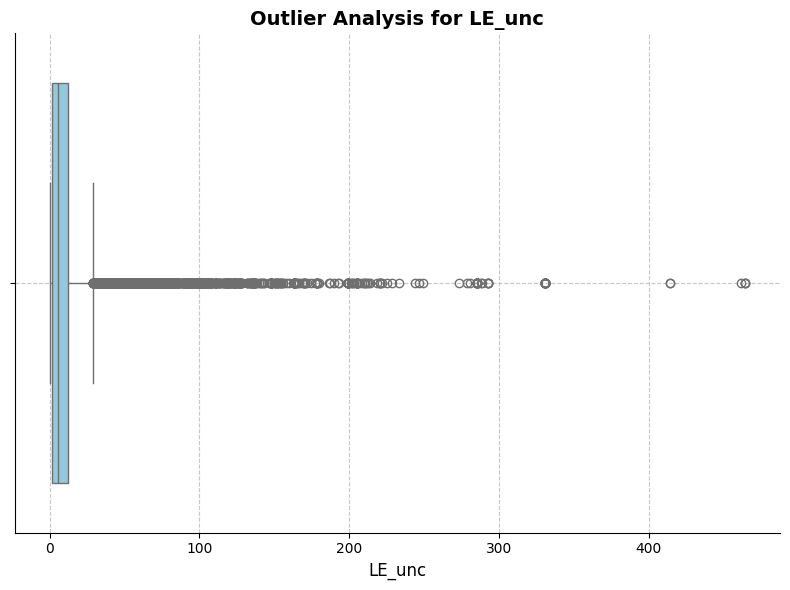

Number of outliers in Tau: 1003


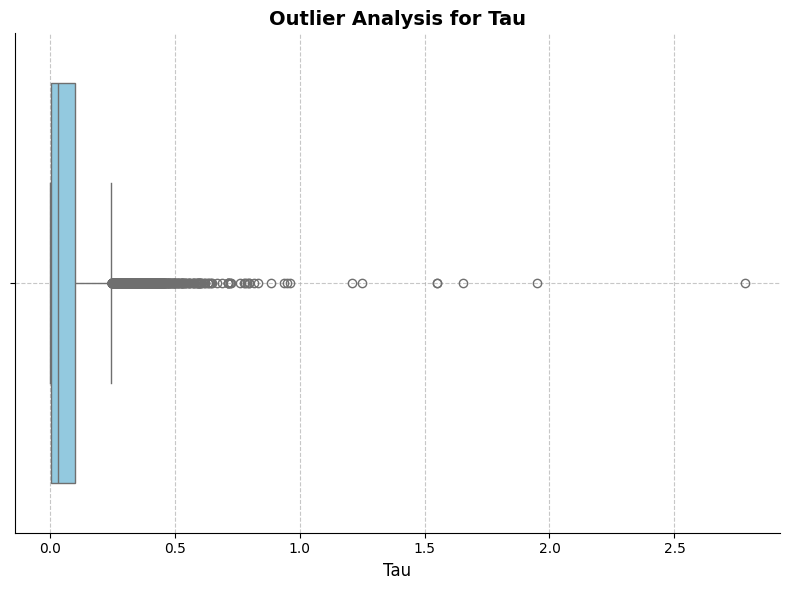

Number of outliers in Tau_unc: 386


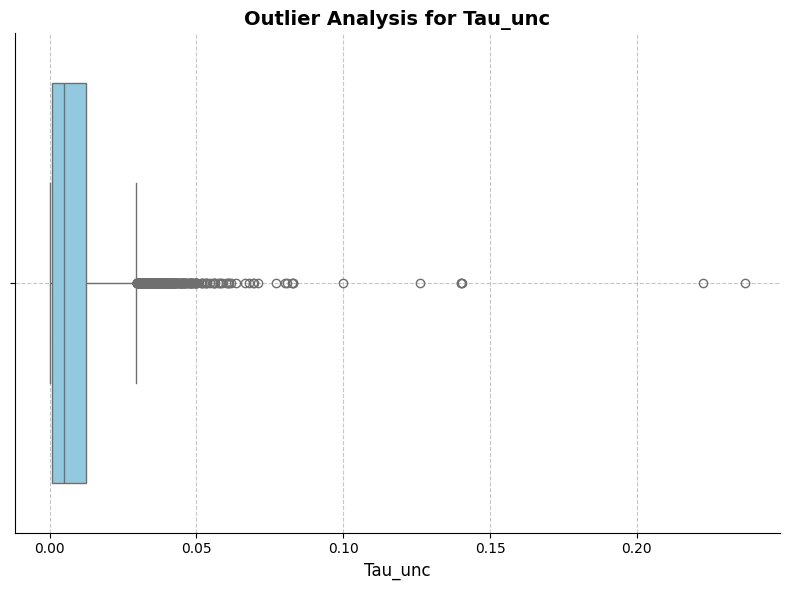

Number of outliers in NEE: 3275


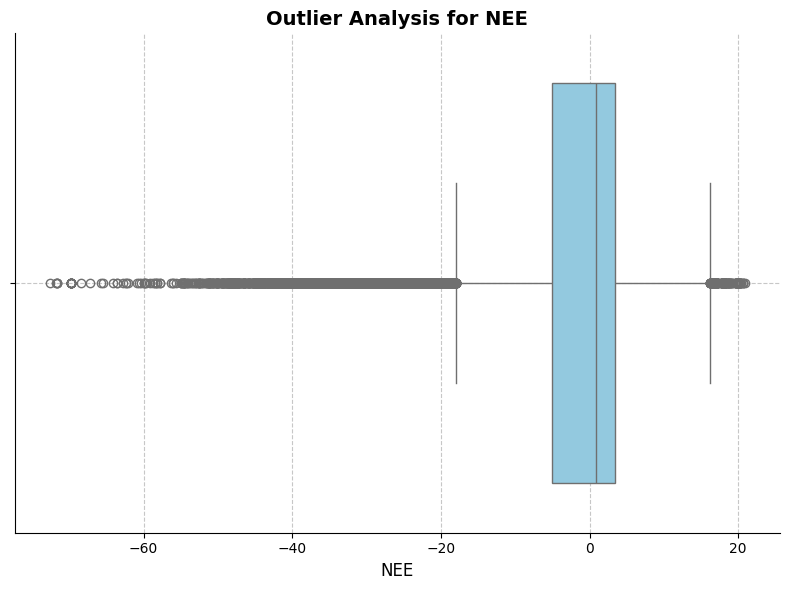

Number of outliers in NEE_unc: 2633


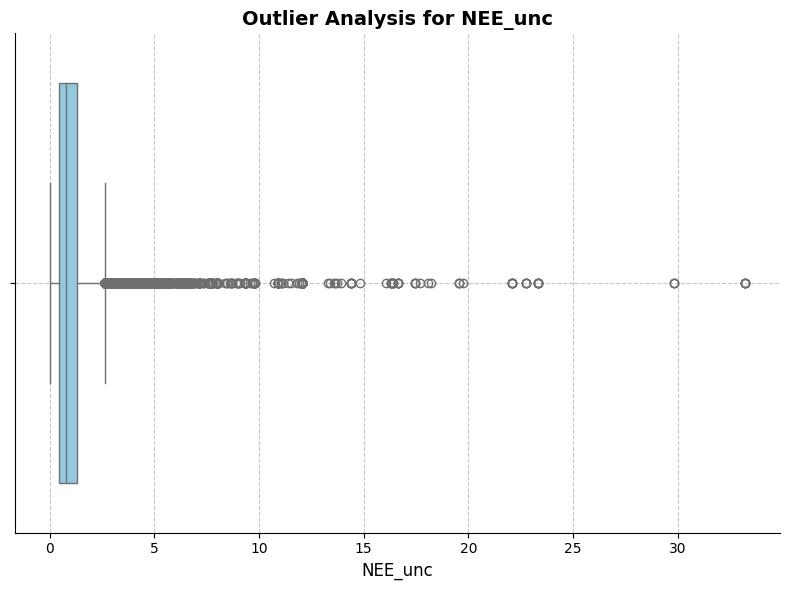

Number of outliers in CO2_strg: 7793


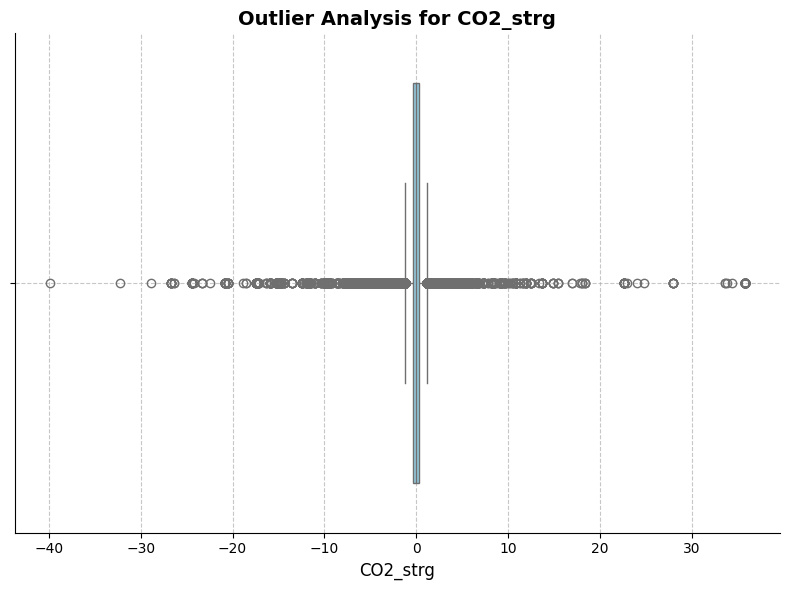

Number of outliers in Pa: 0


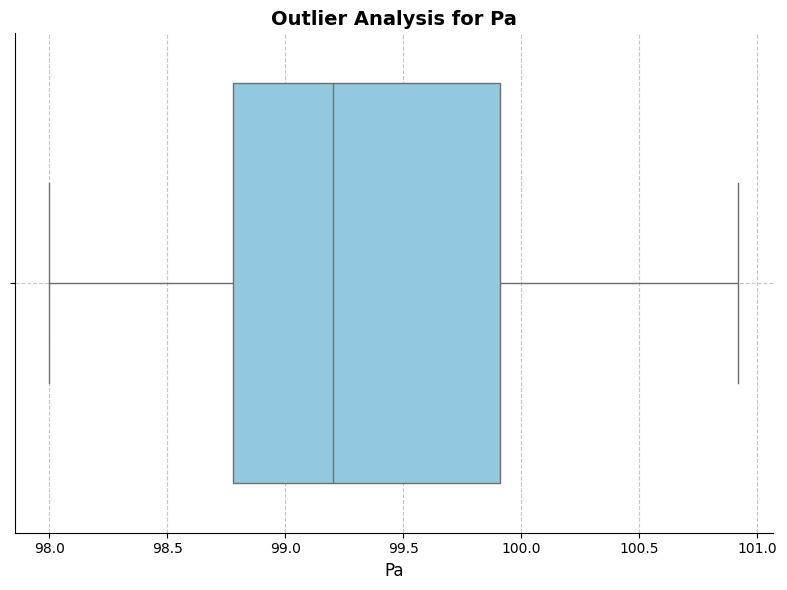

Number of outliers in Ta: 0


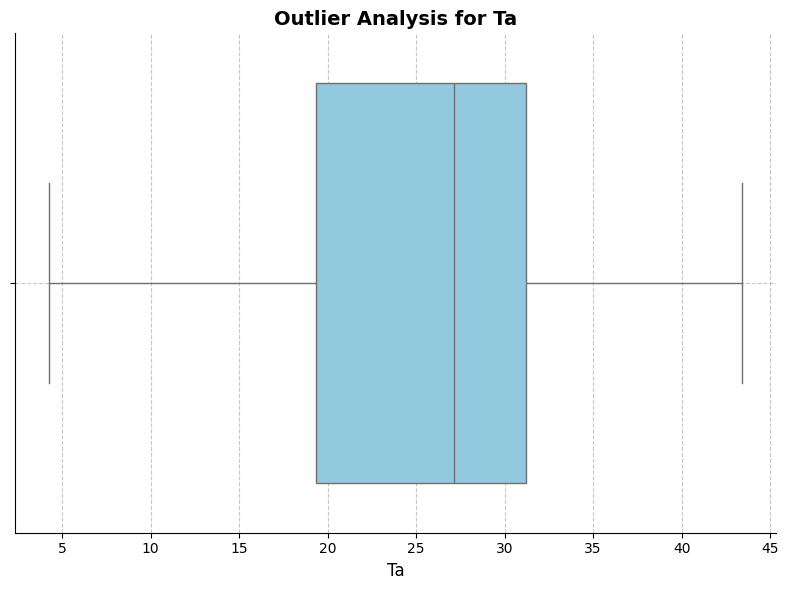

Number of outliers in RH: 0


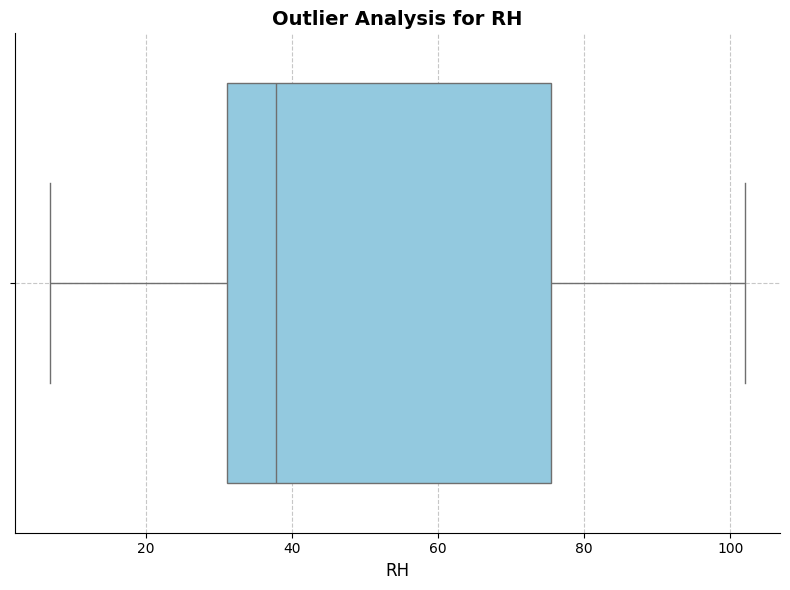

Number of outliers in SWin: 85


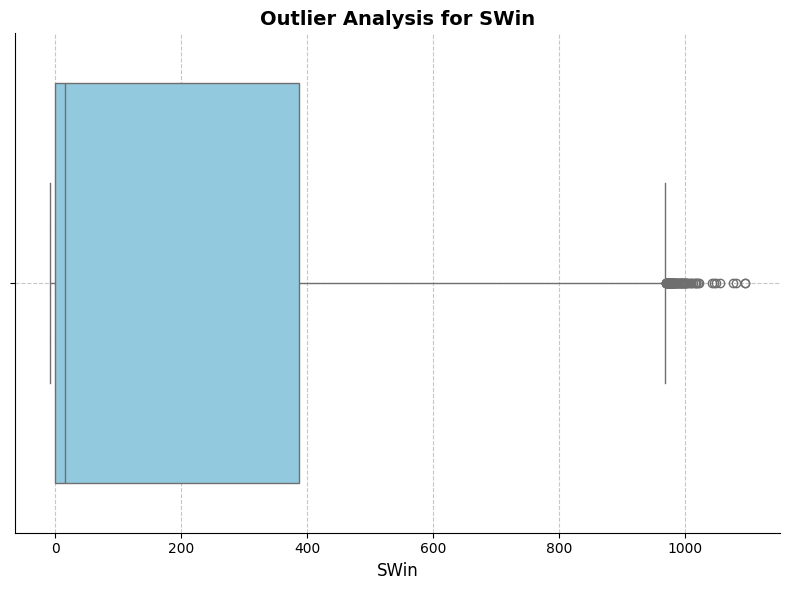

Number of outliers in SWout: 37


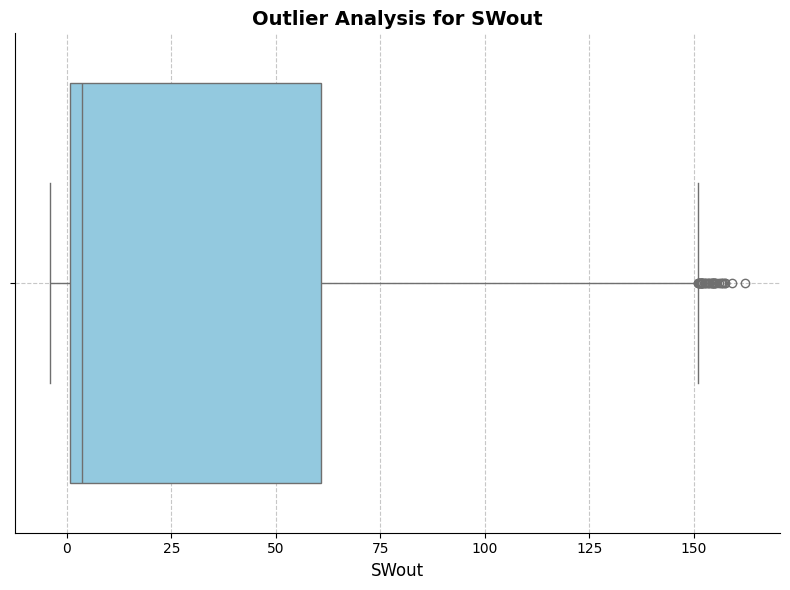

Number of outliers in LWin: 0


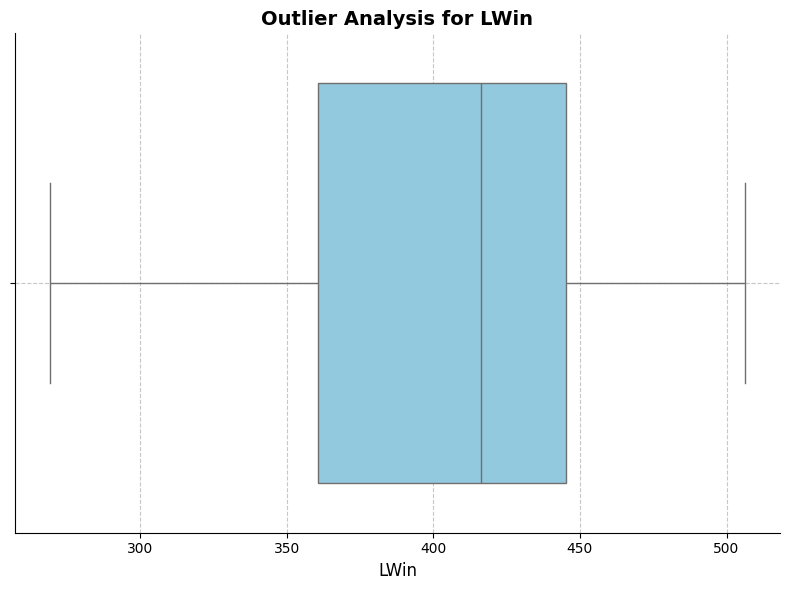

Number of outliers in LWout: 0


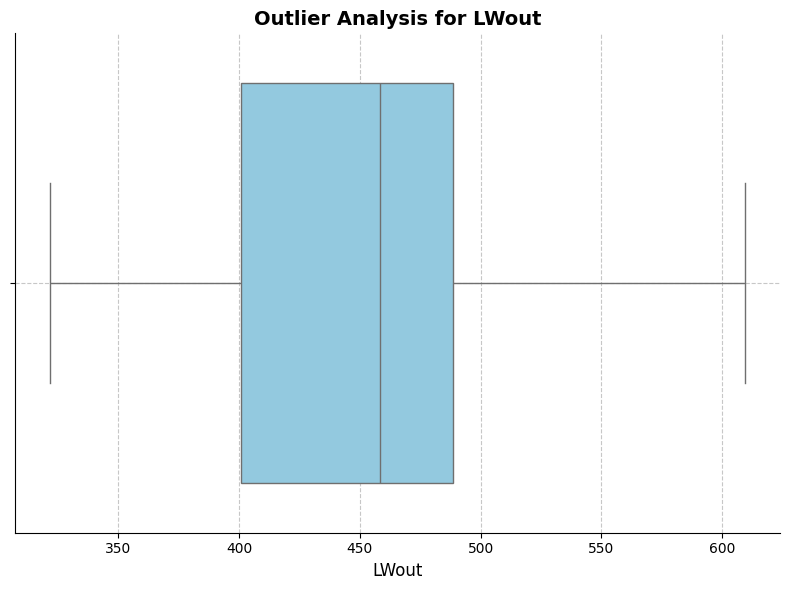

Number of outliers in Rnet: 373


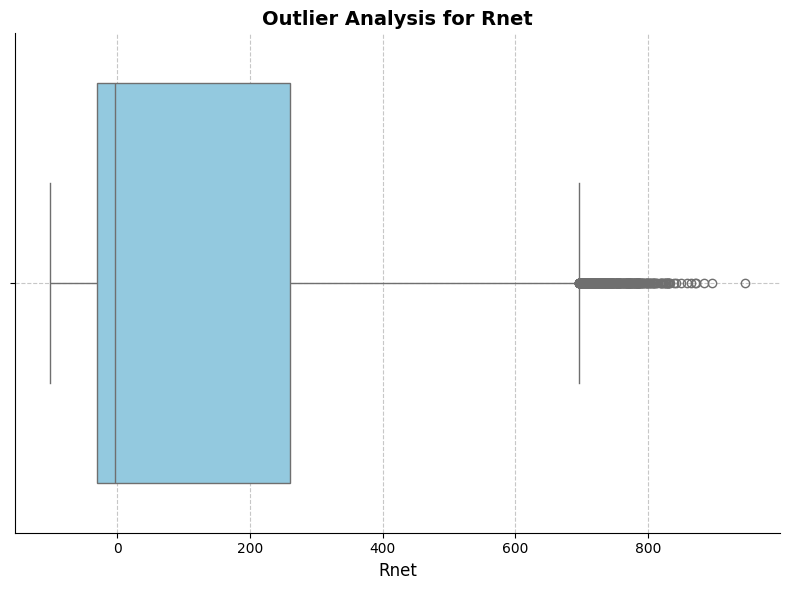

Number of outliers in G1: 2901


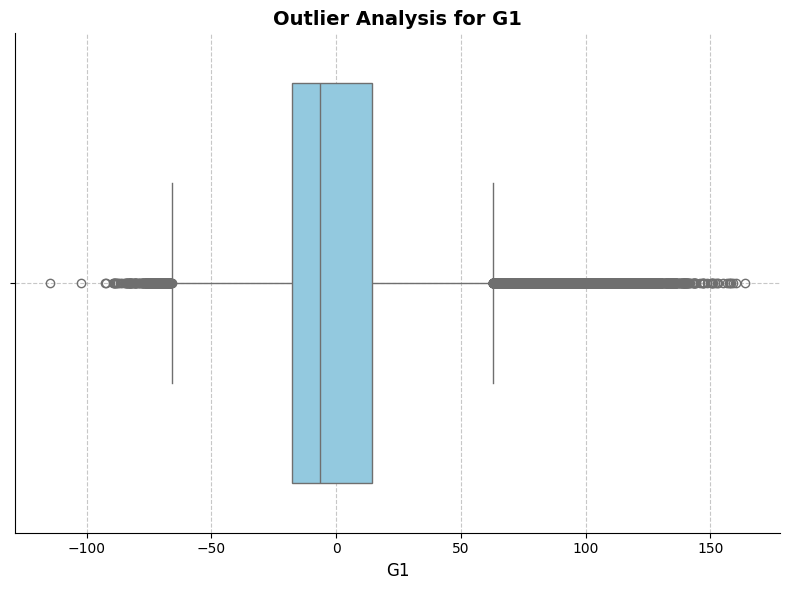

Number of outliers in G2: 2178


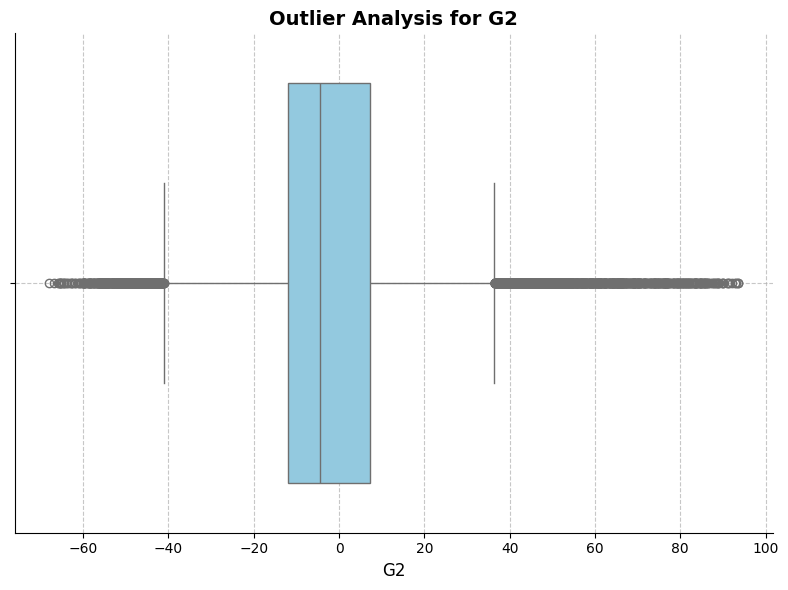

Number of outliers in Tsoil_0.05_1: 0


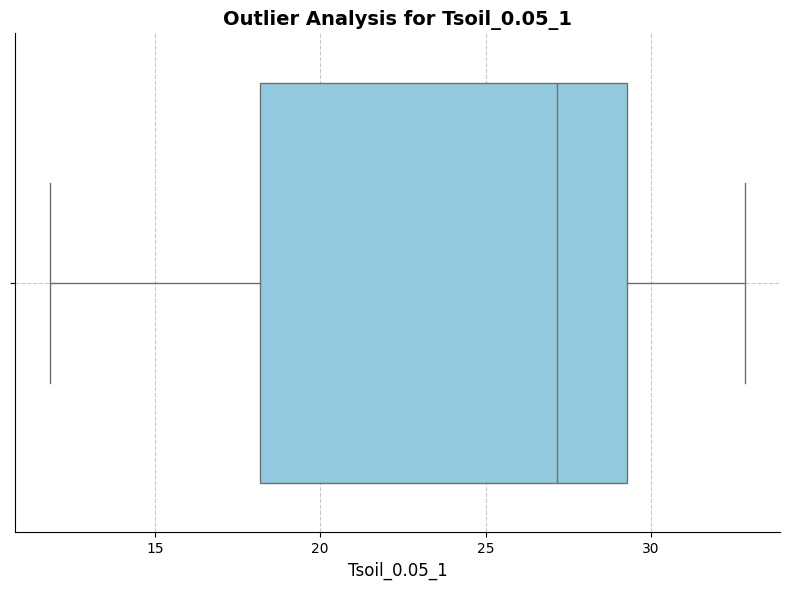

Number of outliers in Tsoil_0.15_1: 0


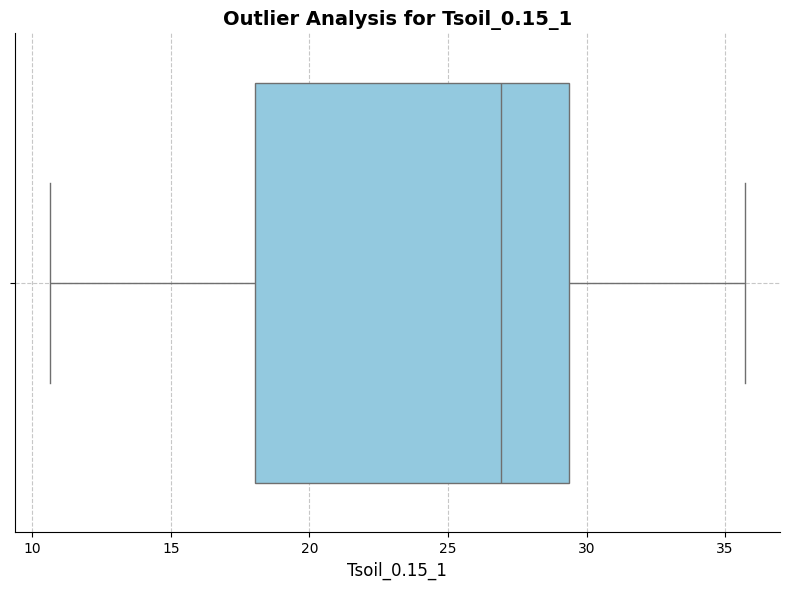

Number of outliers in Tsoil_0.05_2: 0


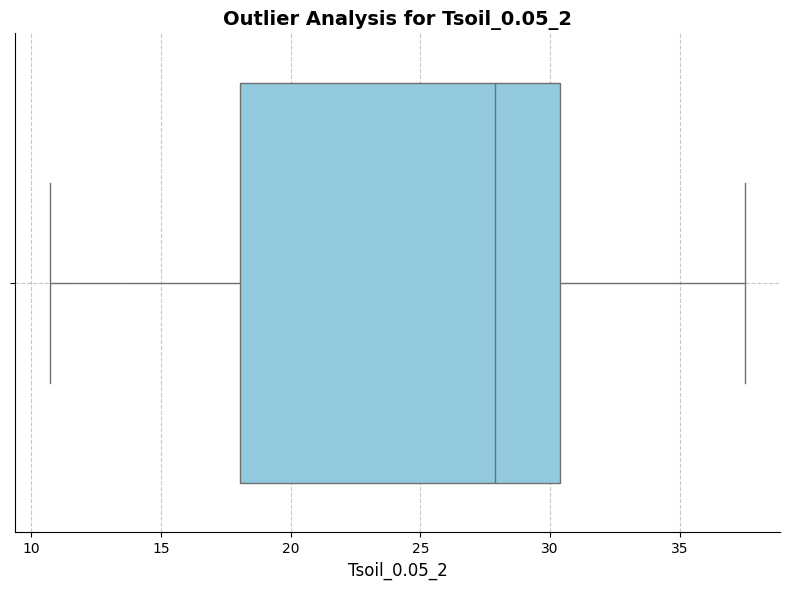

Number of outliers in Tsoil_0.15_2: 0


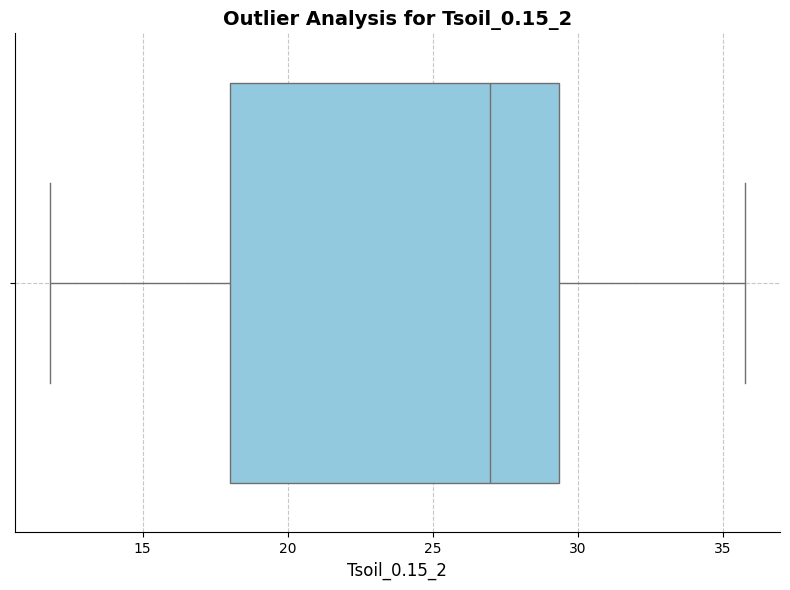

Number of outliers in VWC_0.05_1: 0


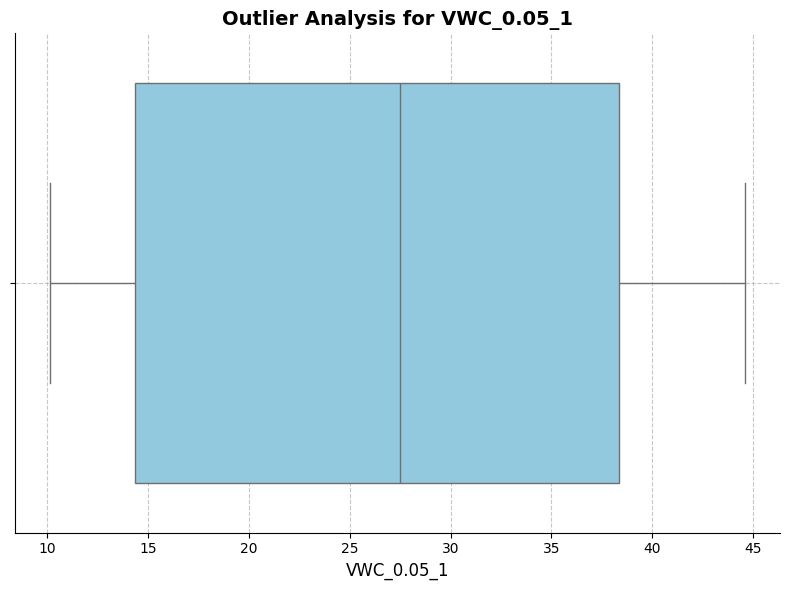

Number of outliers in VWC_0.15_1: 0


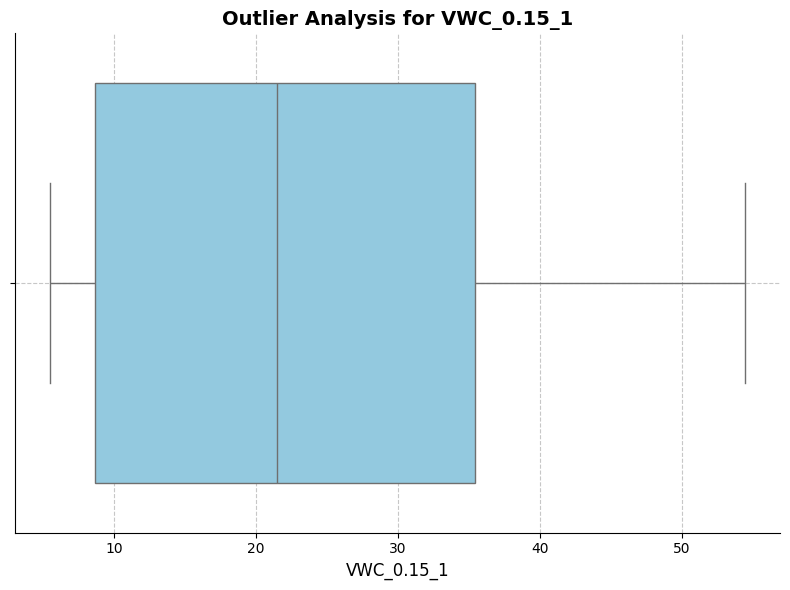

Number of outliers in VWC_0.05_2: 0


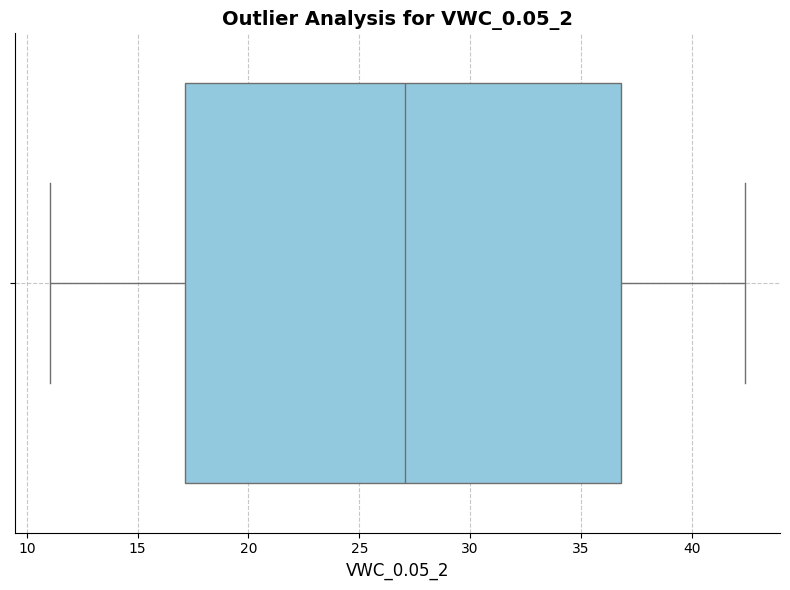

Number of outliers in VWC_0.15_2: 0


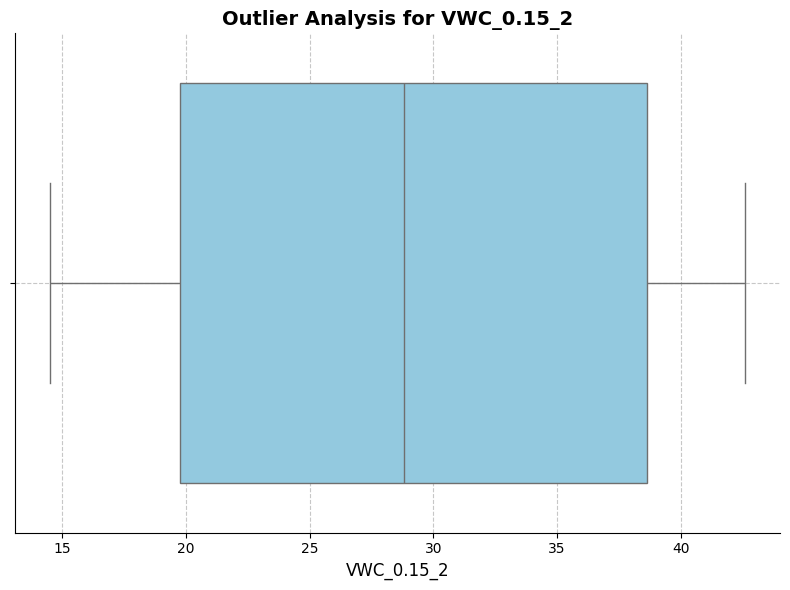

Number of outliers in Precipitation: 586


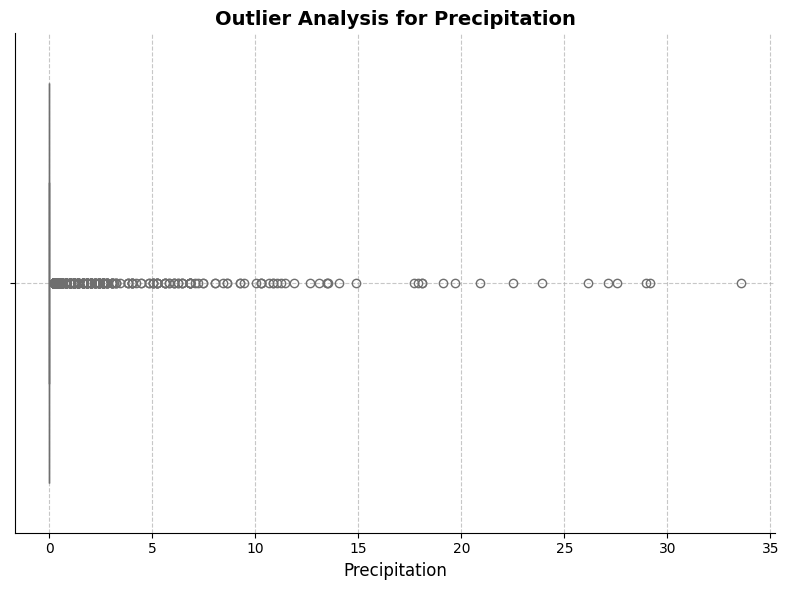

Number of outliers in WS_EC: 336


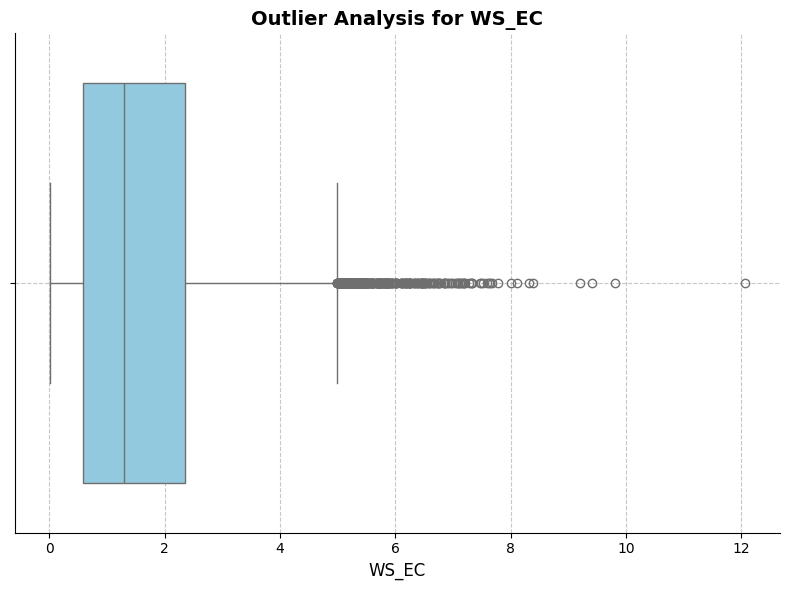

Number of outliers in WD_EC: 0


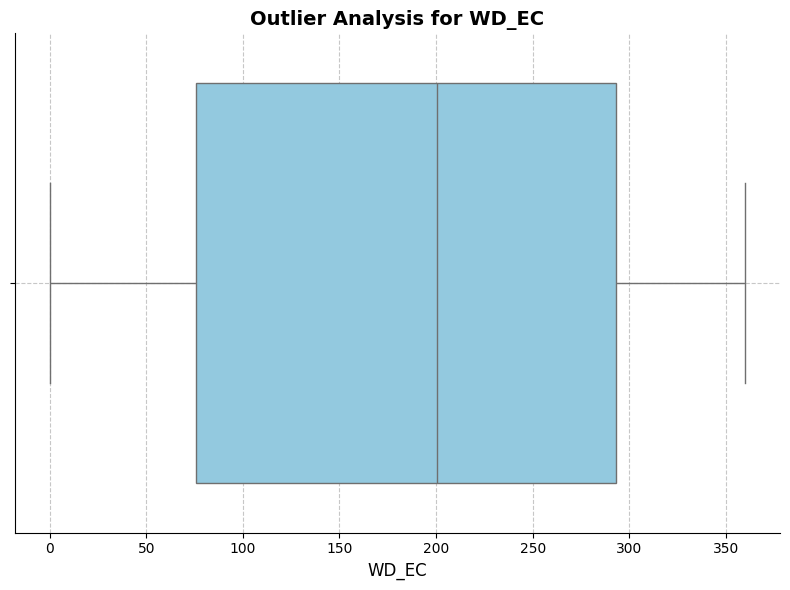

Number of outliers in WS_10m: 794


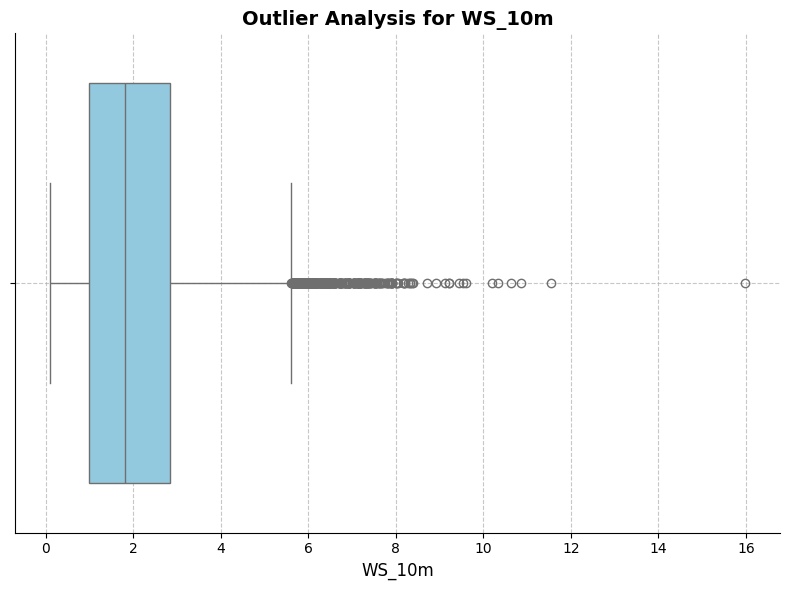

Number of outliers in WD_10m: 0


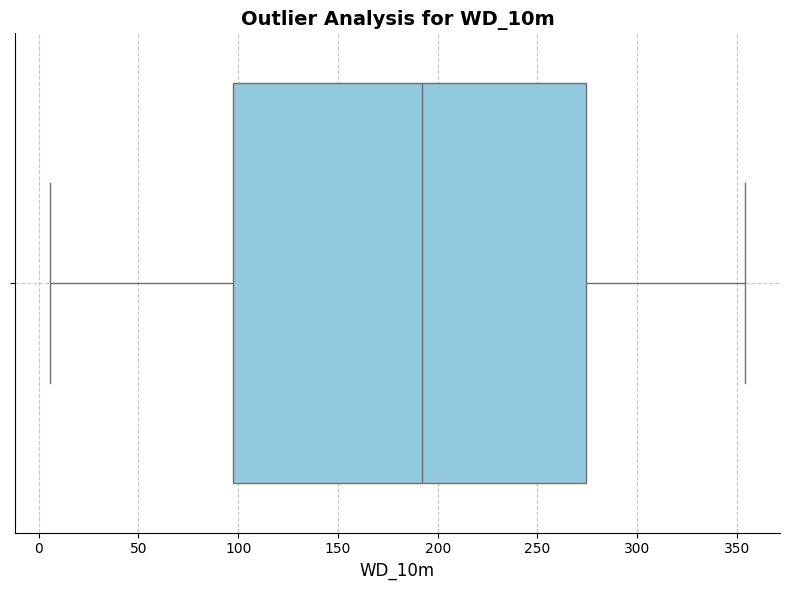

Number of outliers in Ustar: 83


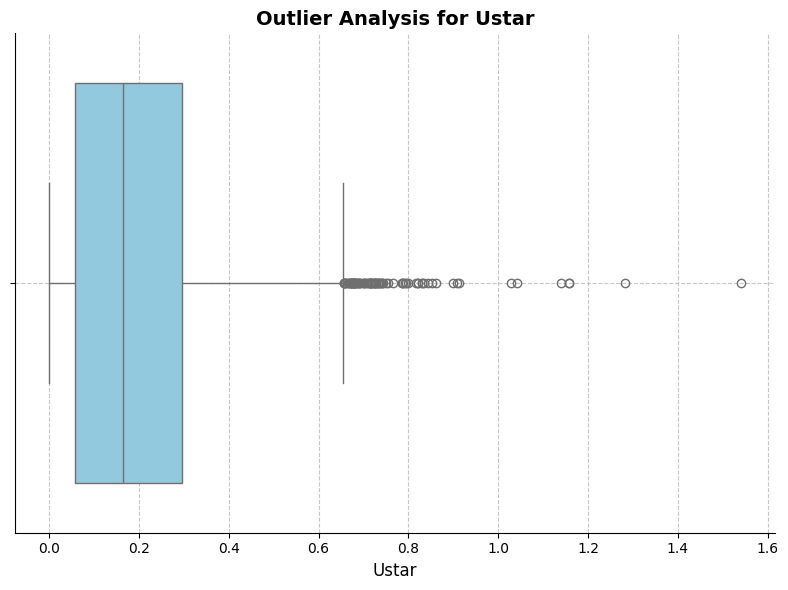

Number of outliers in TKE: 927


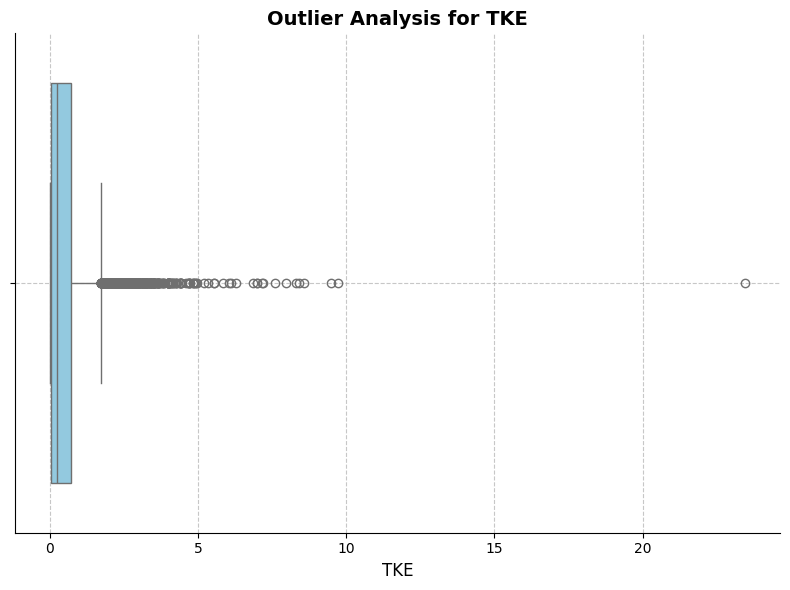

Number of outliers in Tstar: 3764


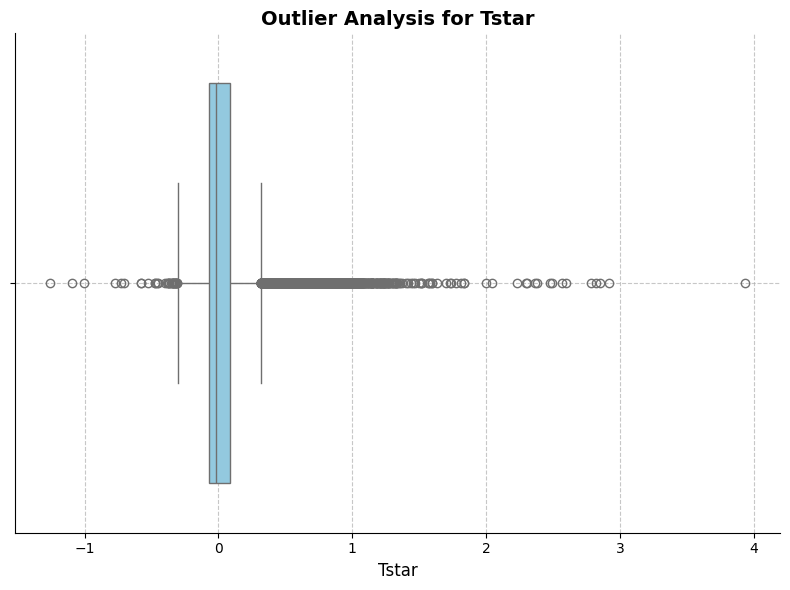

Number of outliers in L: 5646


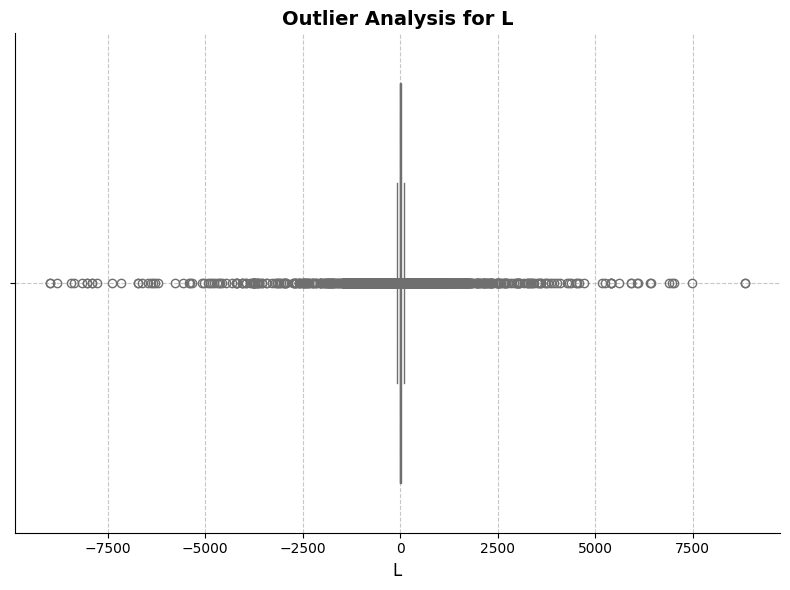

Number of outliers in zL: 7700


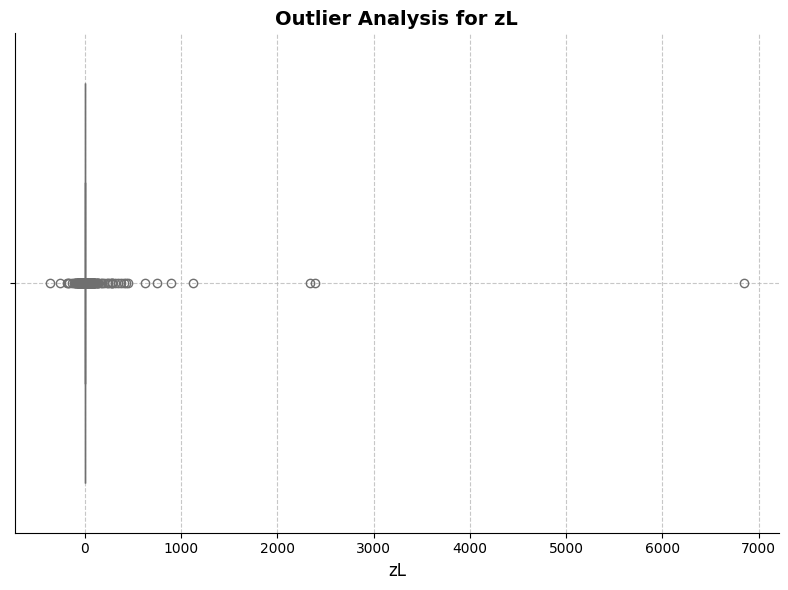

Number of outliers in x_peak: 3118


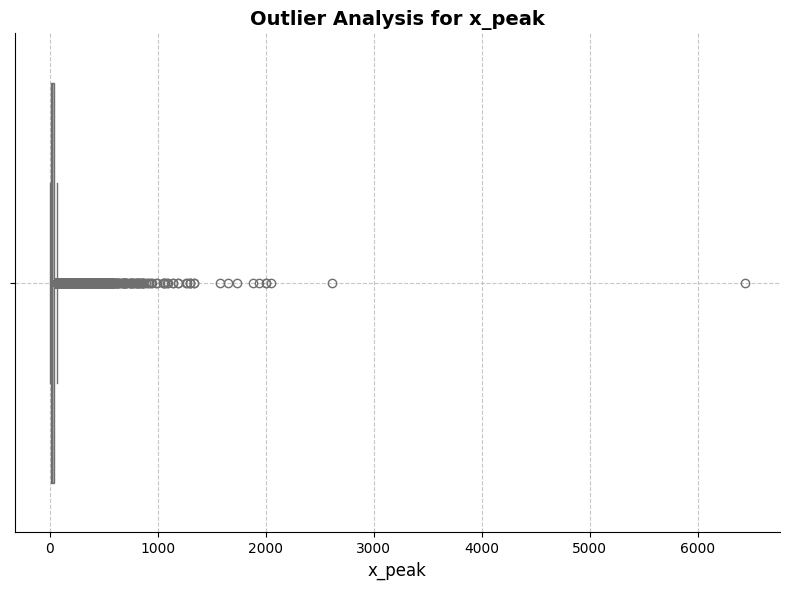

Number of outliers in x_10: 3054


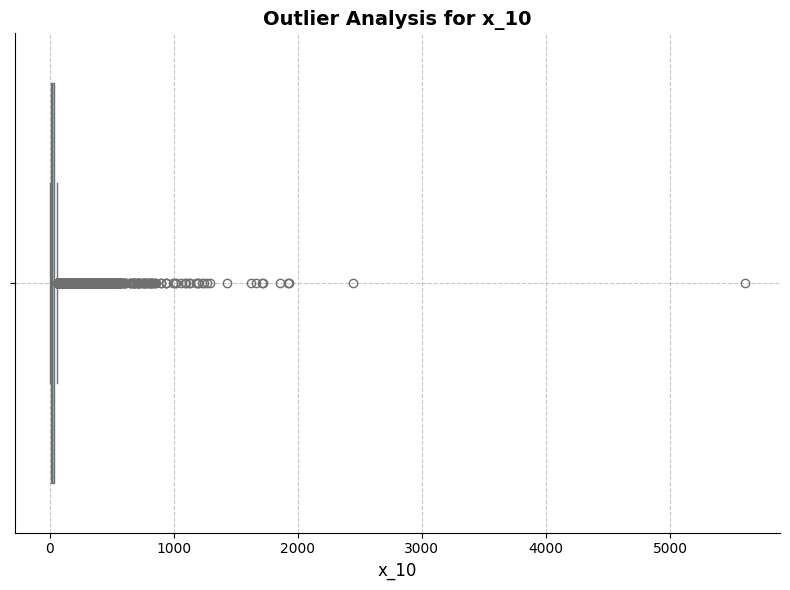

Number of outliers in x_30: 3163


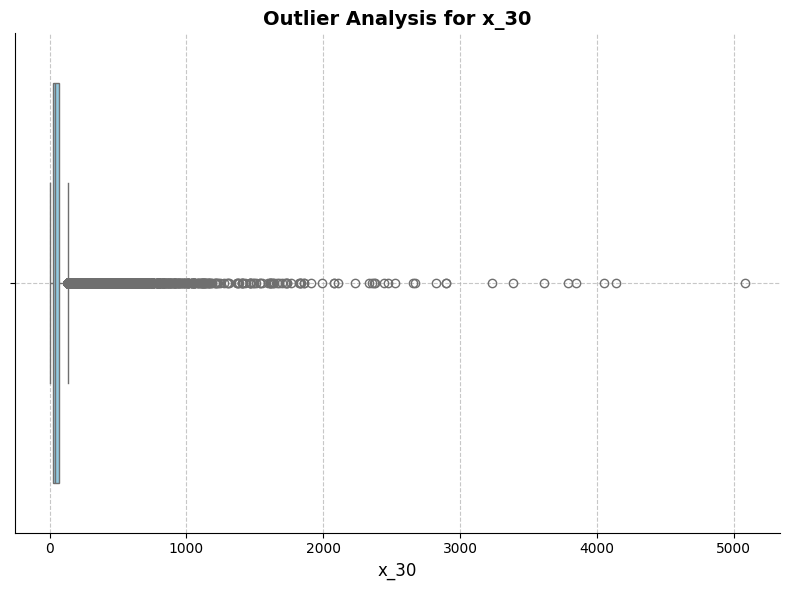

Number of outliers in x_50: 3261


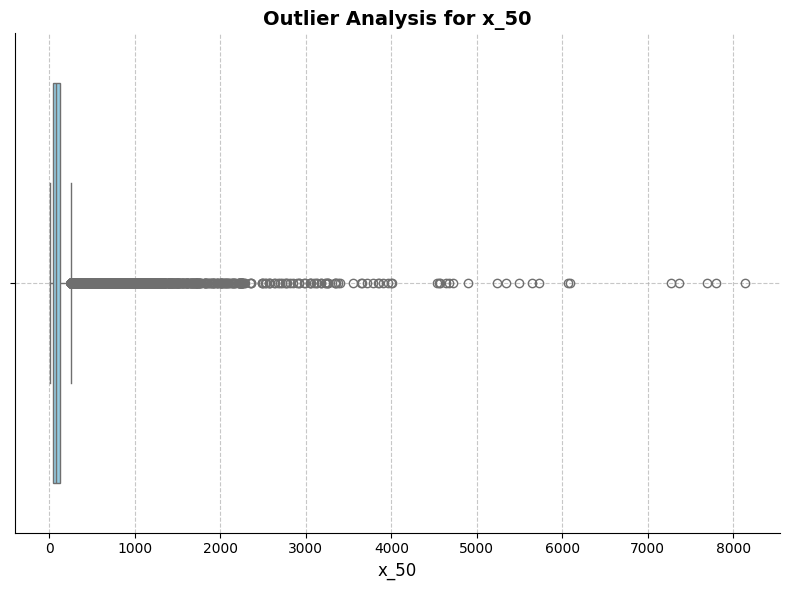

Number of outliers in x_70: 3466


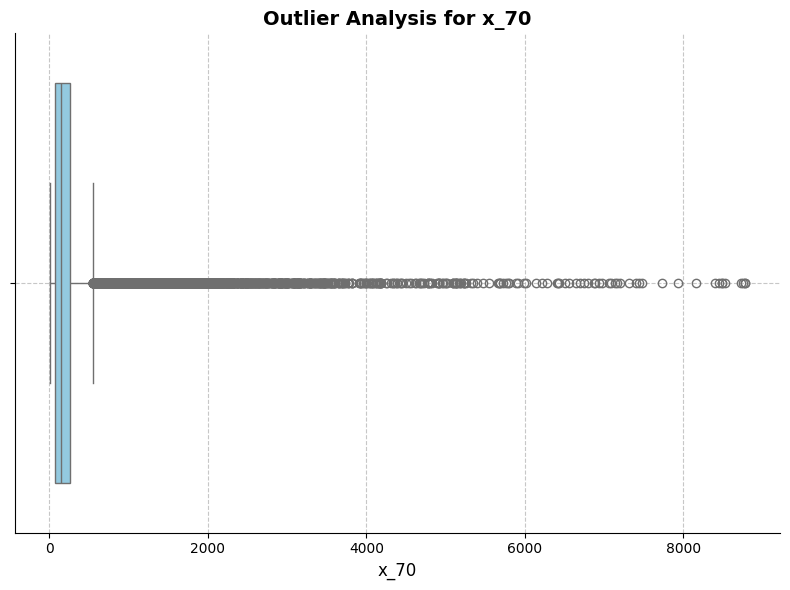

Number of outliers in x_90: 3558


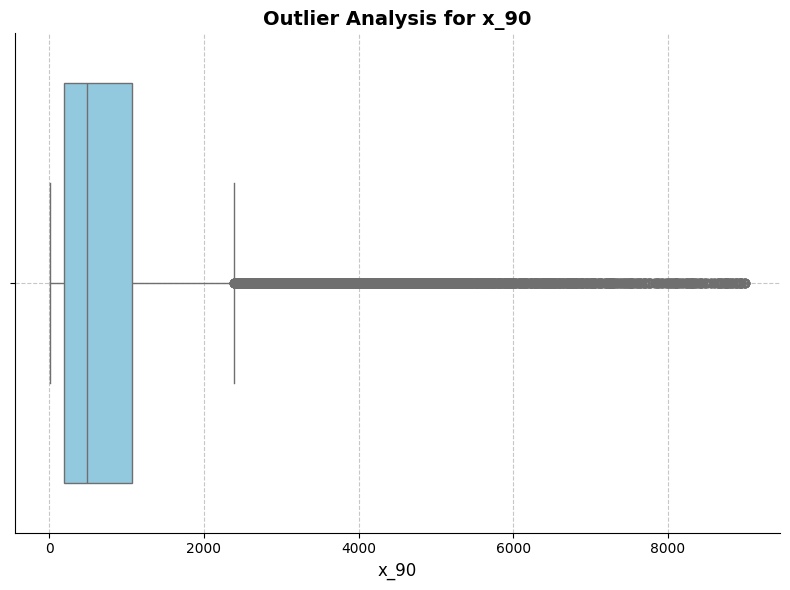

In [ ]:
# Select numerical columns for outlier analysis
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Create box plots and identify outliers using IQR for each numerical column
for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    # Print the number of outliers for the current column
    print(f"Number of outliers in {col}: {len(outliers)}")

    # Create box plots for visualization
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[col], color='skyblue')
    plt.title(f'Outlier Analysis for {col}', fontsize=14, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    sns.despine()
    plt.tight_layout()
    plt.show()

In [ ]:
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Cap outliers using IQR for each numerical column
for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Cap outliers
    df[col] = np.clip(df[col], lower_bound, upper_bound)

In [ ]:
df.columns

Index(['H', 'H_unc', 'LE', 'LE_unc', 'Tau', 'Tau_unc', 'NEE', 'NEE_unc',
       'CO2_strg', 'Pa', 'Ta', 'RH', 'SWin', 'SWout', 'LWin', 'LWout', 'Rnet',
       'G1', 'G2', 'Tsoil_0.05_1', 'Tsoil_0.15_1', 'Tsoil_0.05_2',
       'Tsoil_0.15_2', 'VWC_0.05_1', 'VWC_0.15_1', 'VWC_0.05_2', 'VWC_0.15_2',
       'Precipitation', 'WS_EC', 'WD_EC', 'WS_10m', 'WD_10m', 'Ustar', 'TKE',
       'Tstar', 'L', 'zL', 'x_peak', 'x_10', 'x_30', 'x_50', 'x_70', 'x_90',
       'DateTime'],
      dtype='object')

**Understanding each columns**

DateTime
yyyy-mm/dd HH:MM
Date and time in Indian Standard Time (UTC + 5.5)

H
W m-2
Sensible heat flux density

H_unc
W m-2
Random error for H flux density

H_strg
W m-2
H storage term

LE
W m-2
Latent heat flux density before data gap-filling

LE_unc
W m-2
Random error for LE flux density

LE_strg
W m-2
LE storage term

Tau
kg m-1 s-2
Momentum flux

Tau_unc
kg m-1 s-2
Random error for momentum flux

NEE
μmol CO2 m-2 s-1
Net ecosystem CO2 exchange flux density before data gap-filling

NEE_unc
μmol CO2 m-2 s-1
Random error for NEE flux density

CO2_strg
μmol CO2 m-2 s-1
CO2 storage term

Pa
KPa
Barometric pressure

Ta
ᵒ C
Air temperature

RH
%
Relative humidity of air

SWin
W m-2
Incoming short wave radiation

SWout
W m-2
Outgoing short wave radiation

LWin
W m-2
Incoming long wave radiation

LWout
W m-2
Outgoing long wave radiation

Rnet
W m-2
Net radiation

G1
W m-2
Soil heat flux at 0.03 m depth, location 1

G2
W m-2
Soil heat flux at 0.03 m depth, location 2

Tsoil_0.05_1
ᵒ C
Soil temperature at 0.05 m depth, location 1

Tsoil_0.15_1
ᵒ C
Soil temperature at 0.15 m depth, location 1

Tsoil_0.05_2
ᵒ C
Soil temperature at 0.05 m depth, location 2



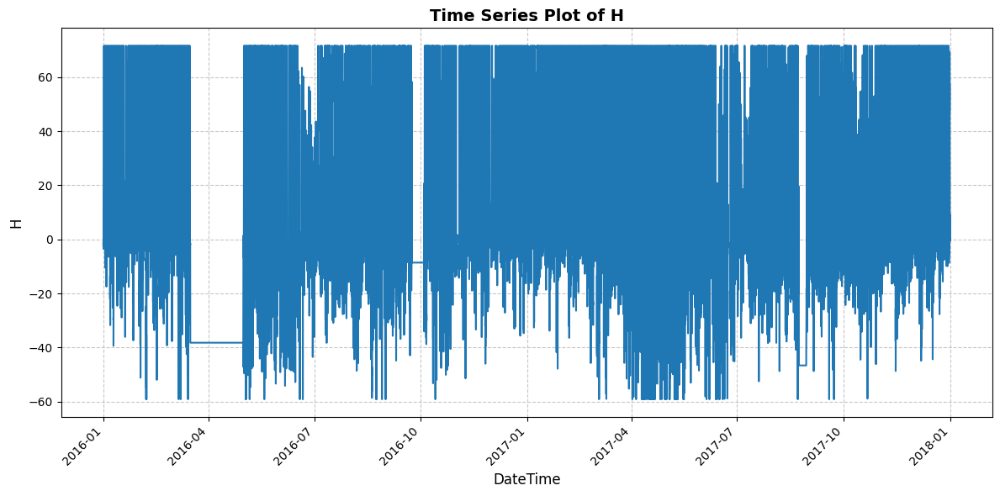

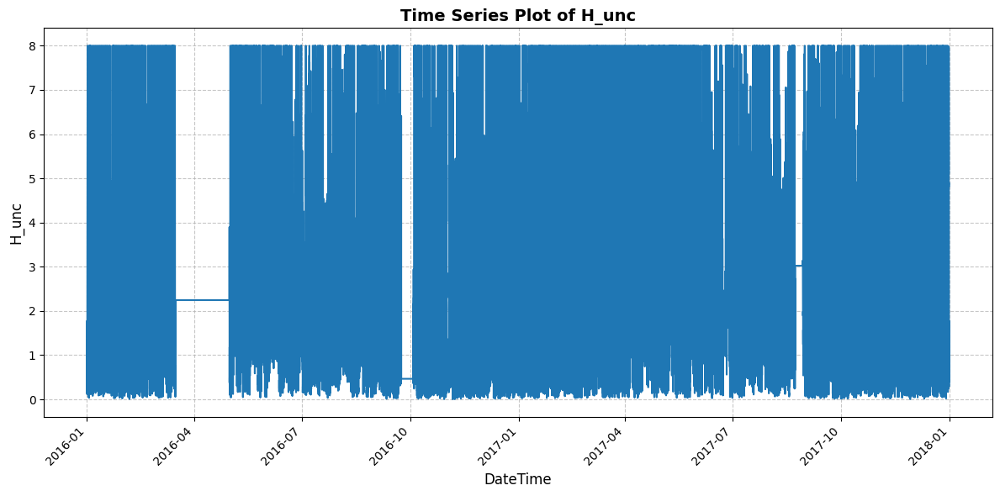

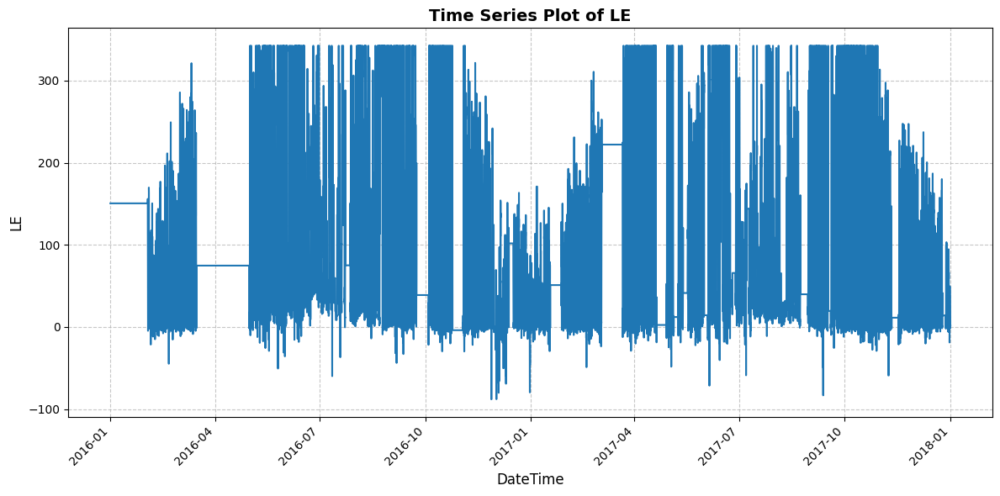

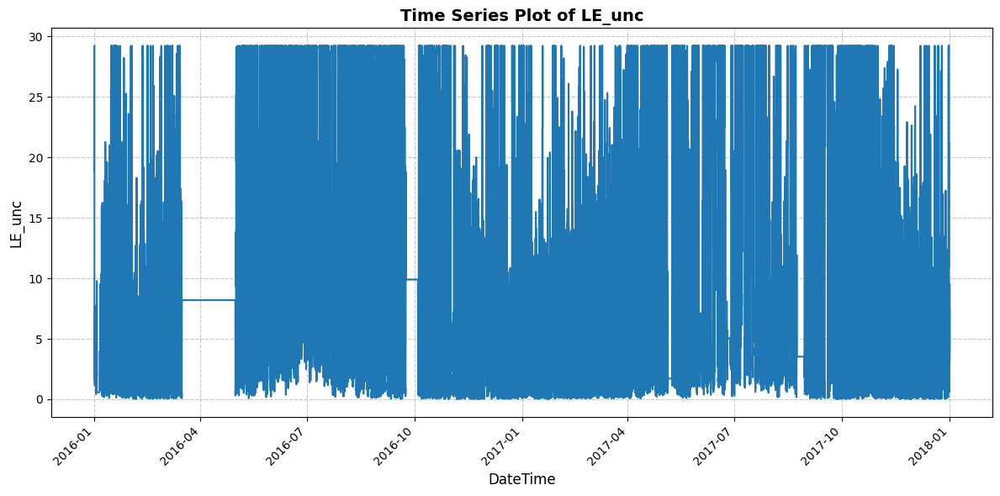

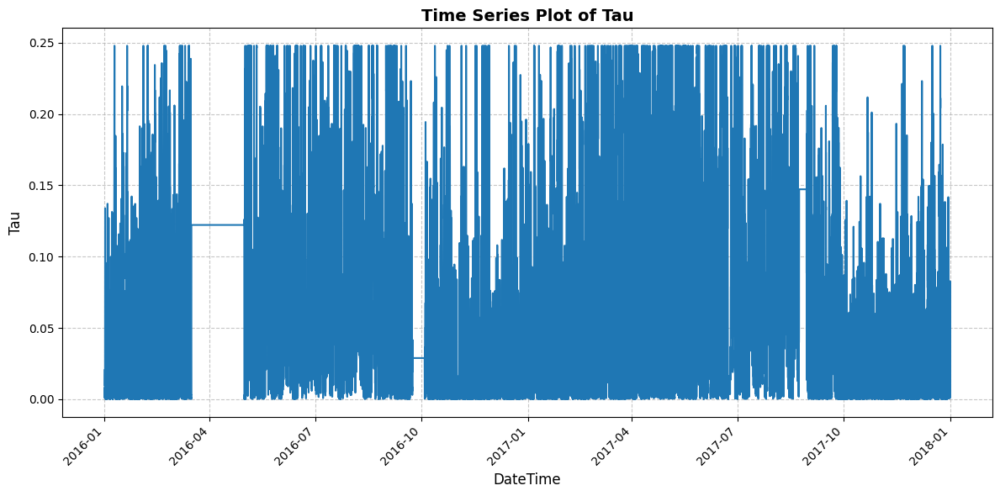

...

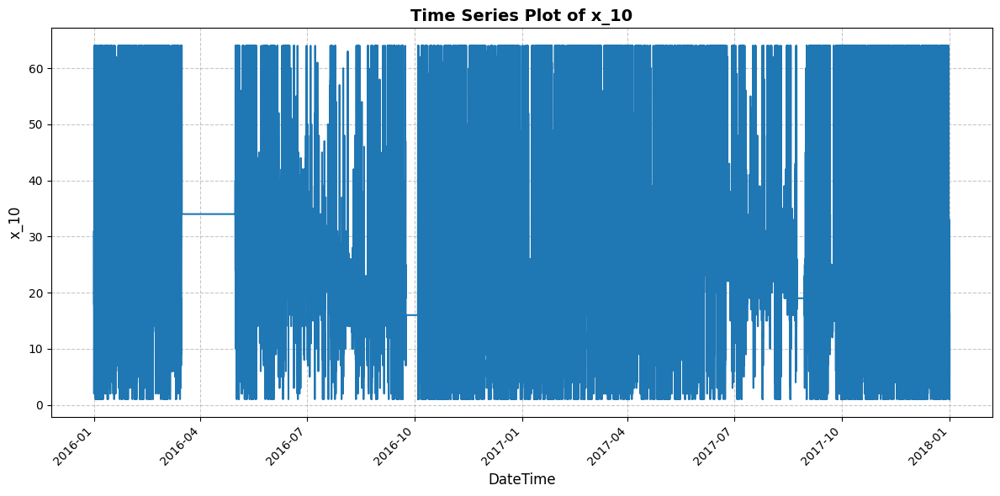

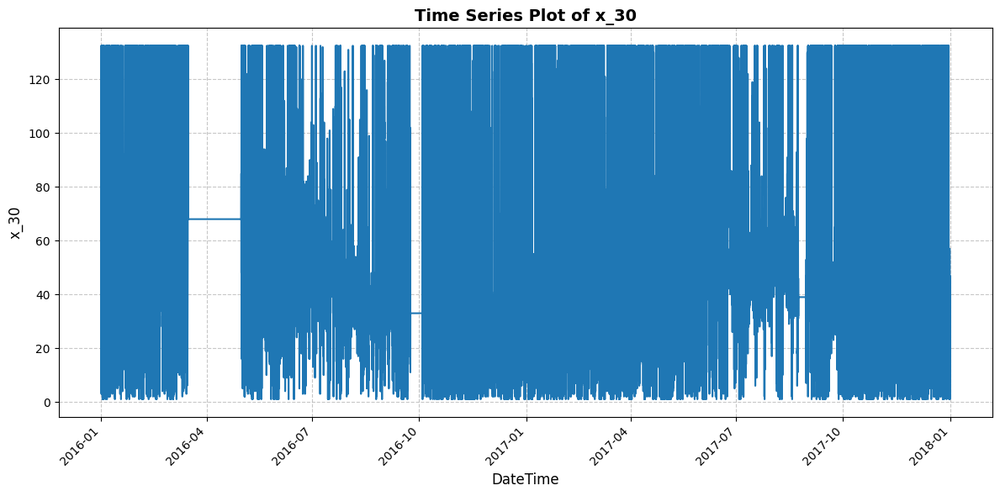

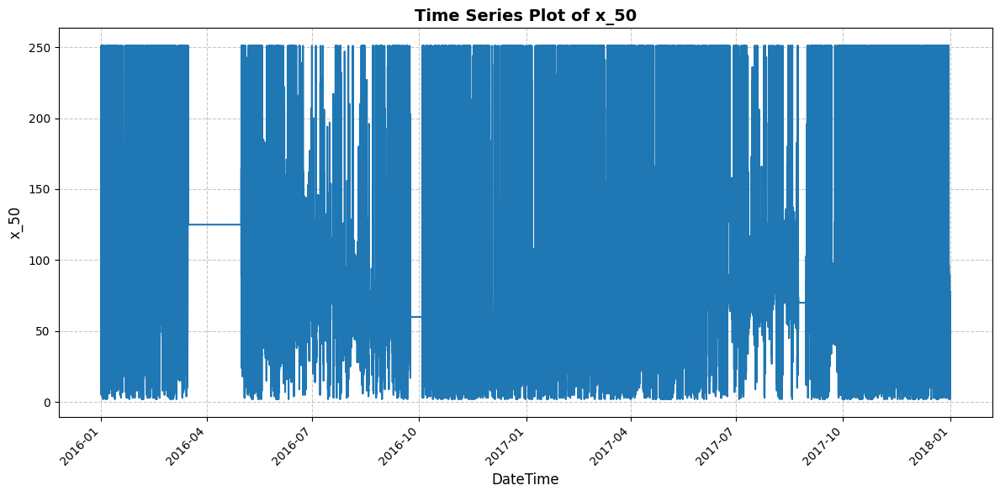

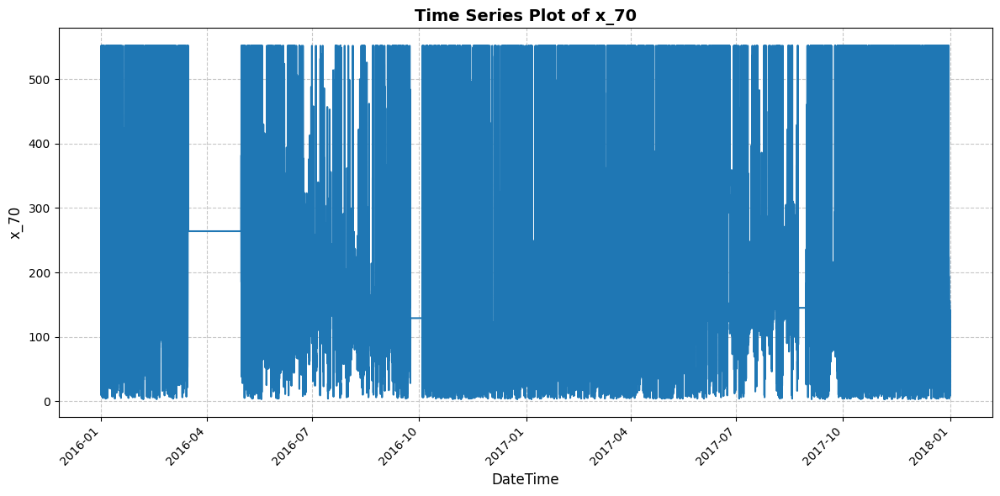

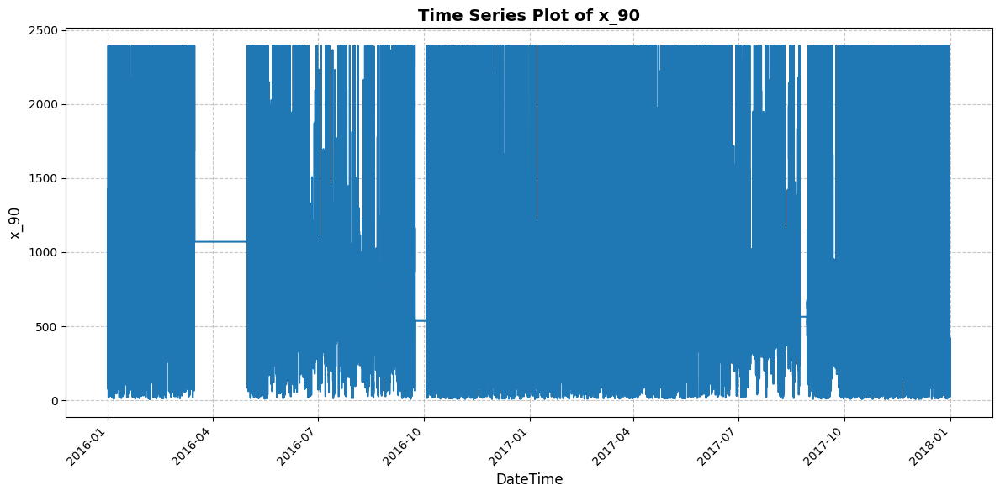

In [ ]:
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Create time series plots for each numerical column
for col in numerical_cols:
    plt.figure(figsize=(12, 6))
    sns.lineplot(x='DateTime', y=col, data=df)
    plt.title(f'Time Series Plot of {col}', fontsize=14, fontweight='bold')
    plt.xlabel('DateTime', fontsize=12)
    plt.ylabel(col, fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

**We have a lot of features here so we need to eliminate them. To determine what to eliminate we will plot a heatmap**

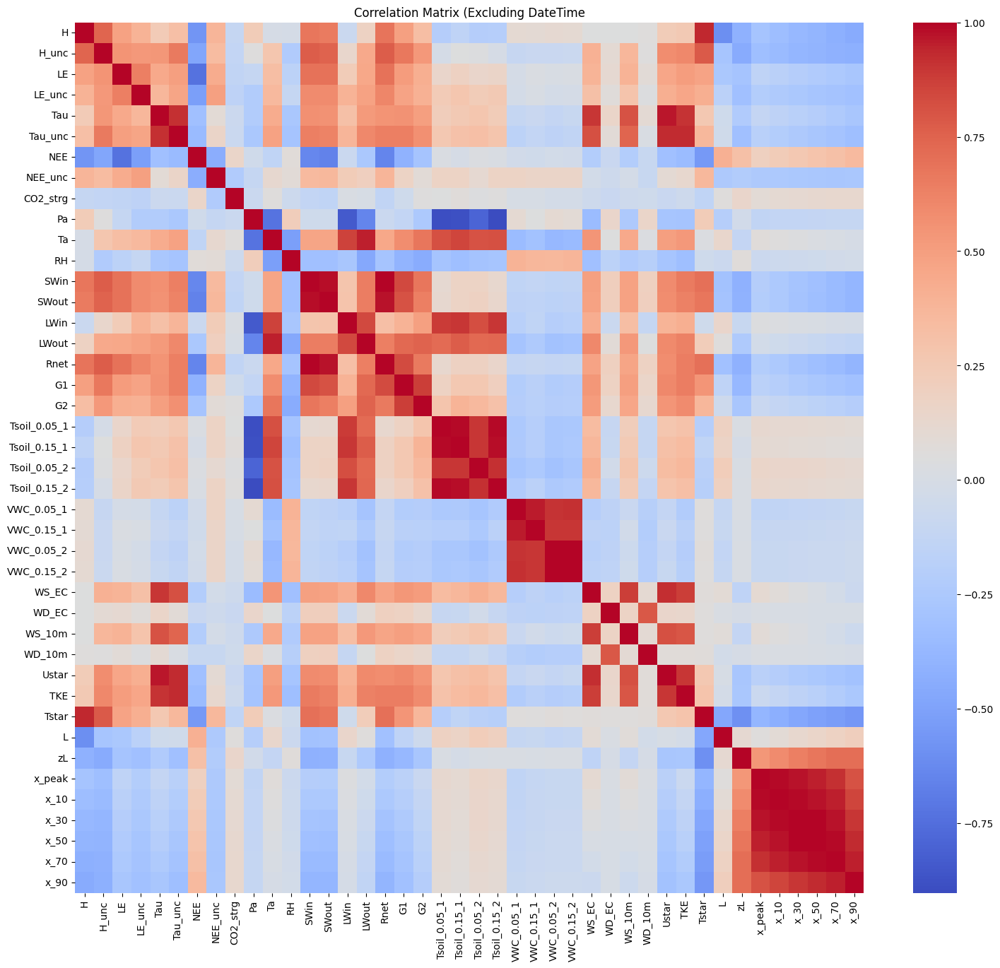

In [ ]:
data_numeric = df.drop(['DateTime','Precipitation'], axis=1) #Dropped precipitaion due to zero values

# Calculate the correlation matrix
correlation_matrix = data_numeric.corr()

# Plot the correlation matrix without annotations
plt.figure(figsize=(18, 16))
sns.heatmap(correlation_matrix, cmap='coolwarm', fmt="")
plt.title('Correlation Matrix')
plt.show()

**Inference:**
1. From Time-Series Plot:

    1.1 We can infer the variations occuring in the features during different seasons

2. From Heat-Map:

    2.1 We can infer how different parameters are correlated with each other. So we can determine different parameters which are boundary value co-relations with (Ta)



**Following are the fetures selected based on above to parameters.**
1. SWin (Incoming Shortwave Radiation)
2. SWout (Outgoing Shortwave Radiation)
3. LWin (Incoming Longwave Radiation)
4. LWout (Outgoing Longwave Radiation)
5. G1 (Soil Heat Flux at 0.03 m, location 1)
6. G2 (Soil Heat Flux at 0.03 m, location 2)
7. Tsoil_0.05_1 (Soil Temperature at 0.05 m, location 1)
8. Tsoil_0.05_2 (Soil Temperature at 0.05 m, location 2)
9. Pa (Barometric Pressure)
10. WS_EC (Mean Wind Speed)
11. WD_EC (Wind Direction from EC)
12. VWC_0.05_1 (Soil Volumetric Water Content at 0.05 m)
13. Ustar (Friction Velocity)
14. Tstar (Temperature Scaling Parameter)
15. LE (Latent heat flux density before data gap-filling)

In [ ]:
# Define the columns to keep
columns_to_keep = ['DateTime','SWin', 'LWin', 'SWout', 'LWout','G1', 'G2', 'Tsoil_0.05_1', 'Tsoil_0.05_2',
                   'Pa', 'WS_EC', 'WD_EC', 'VWC_0.05_1',
                   'Ustar', 'Tstar', 'LE','Ta','RH']

# Select the columns and create a new DataFrame
df = df[columns_to_keep]

In [ ]:
df

,DateTime,SWin,LWin,SWout,LWout,G1,G2,Tsoil_0.05_1,Tsoil_0.05_2,Pa,WS_EC,WD_EC,VWC_0.05_1,Ustar,Tstar,LE,Ta,RH
0,2016-01-01 00:30:00,-2.3061,355.5667,1.9582,374.6367,-5.7250,-37.1903,15.9820,16.5087,100.4467,0.3526,299.6254,42.0137,0.0439,-0.0426,150.5684,12.7556,97.9850
1,2016-01-01 01:00:00,-2.7614,354.7433,1.6285,373.6833,-5.9796,-38.6615,15.8797,16.4643,100.4333,0.3695,315.0408,42.0527,0.0335,-0.0046,150.5684,12.1394,98.3706
2,2016-01-01 01:30:00,-2.5296,355.2767,1.3944,373.6400,-5.8415,-39.0089,15.7683,16.4067,100.5000,0.5778,292.9007,42.0797,0.0654,-0.0236,150.5684,12.0261,98.6817
3,2016-01-01 02:00:00,-2.8767,353.7600,1.4567,371.4967,-5.6001,-38.7332,15.6610,16.3640,100.5000,0.1305,187.6768,42.1123,0.0454,-0.0141,150.5684,11.2672,99.5878
4,2016-01-01 02:30:00,-2.1375,353.0100,2.2068,370.8367,-5.5633,-38.4674,15.5517,16.3237,100.4967,0.3674,294.2858,42.1447,0.0808,-0.0541,150.5684,11.4194,100.0256
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35083,2017-12-31 22:00:00,-0.2632,372.1967,0.0400,373.6967,-4.1578,-3.6959,14.2027,14.3450,100.0667,0.4900,235.1763,27.3123,0.2086,0.0371,1.9641,11.4972,100.9011
35084,2017-12-31 22:30:00,-0.0592,372.0333,0.1823,373.3367,-4.5787,-3.8906,14.2167,14.3393,100.1000,0.1011,105.6871,27.3027,0.0938,-0.0050,1.9641,11.4594,100.9589
35085,2017-12-31 23:00:00,-0.2008,372.0533,0.0869,373.3500,-4.8221,-4.1733,14.2213,14.3410,100.0333,0.7262,251.4299,27.2990,0.1287,0.0174,1.9641,11.4517,100.9489
35086,2017-12-31 23:30:00,-0.1530,371.7133,0.1157,372.9867,-4.8834,-4.2705,14.2280,14.3373,100.0367,0.8051,234.6192,27.3000,0.1483,0.0199,1.9641,11.3867,100.9422


We will plot how features are related with air temperature.

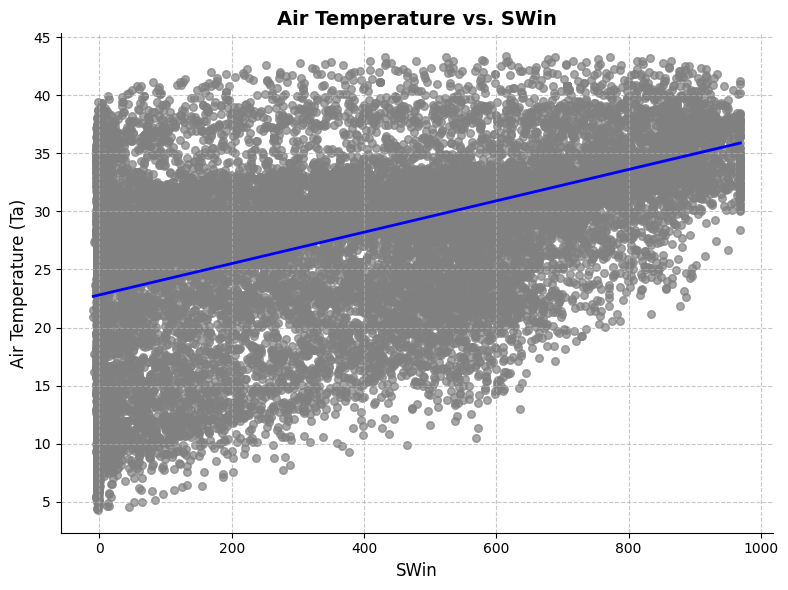

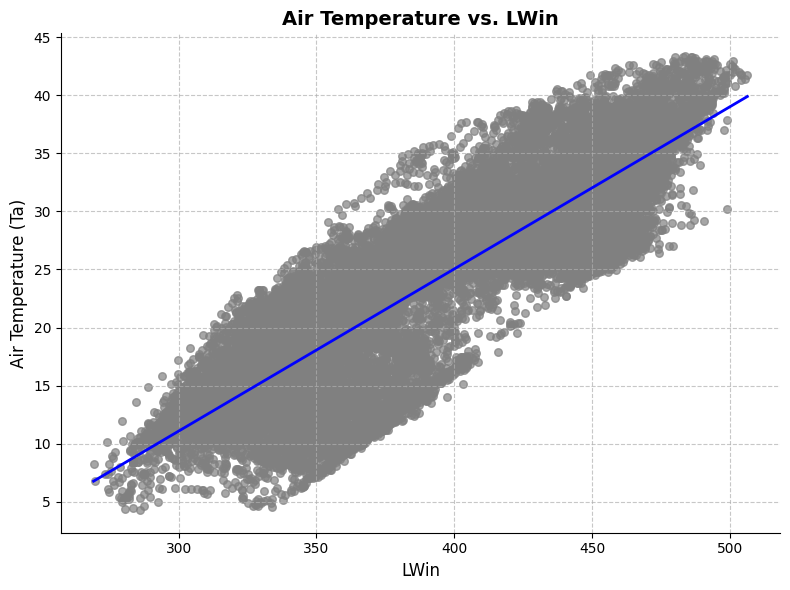

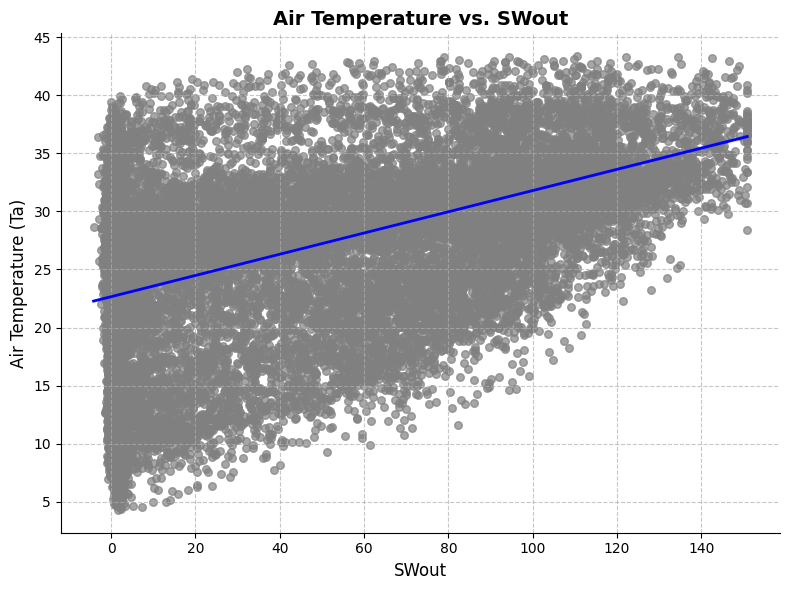

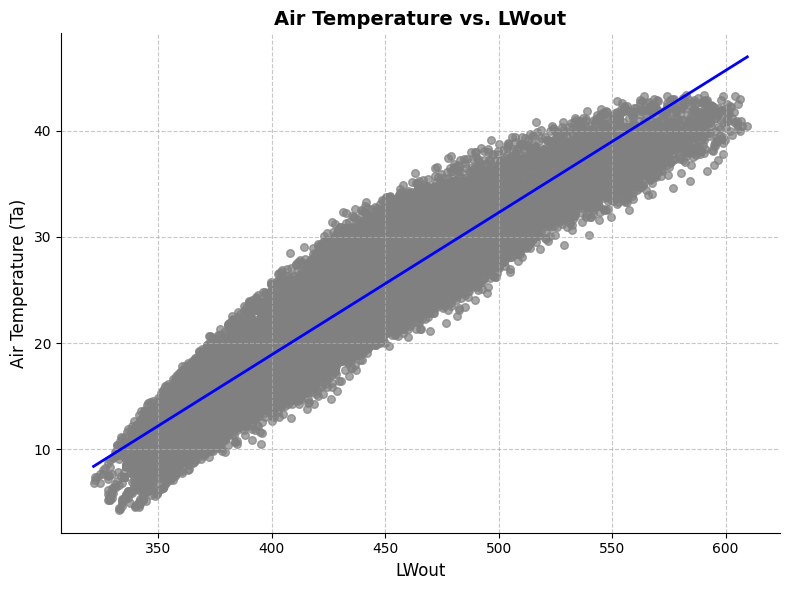

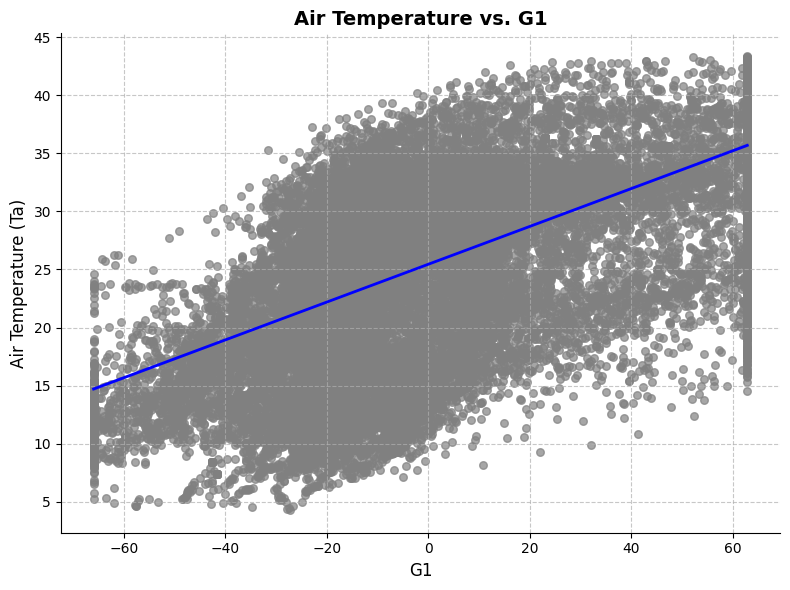

...

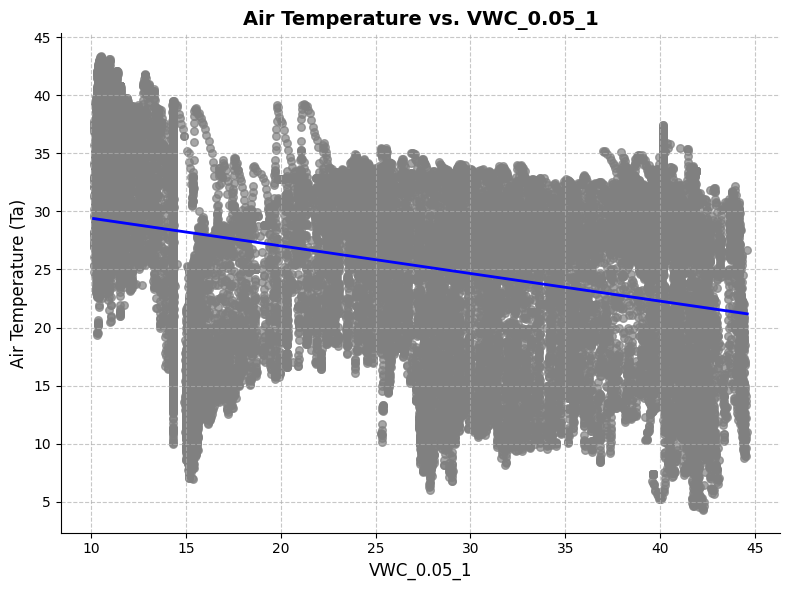

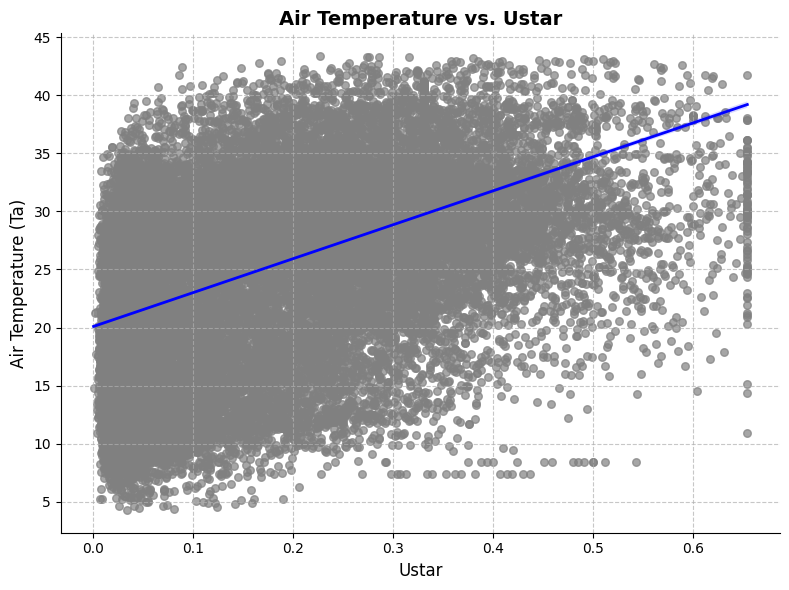

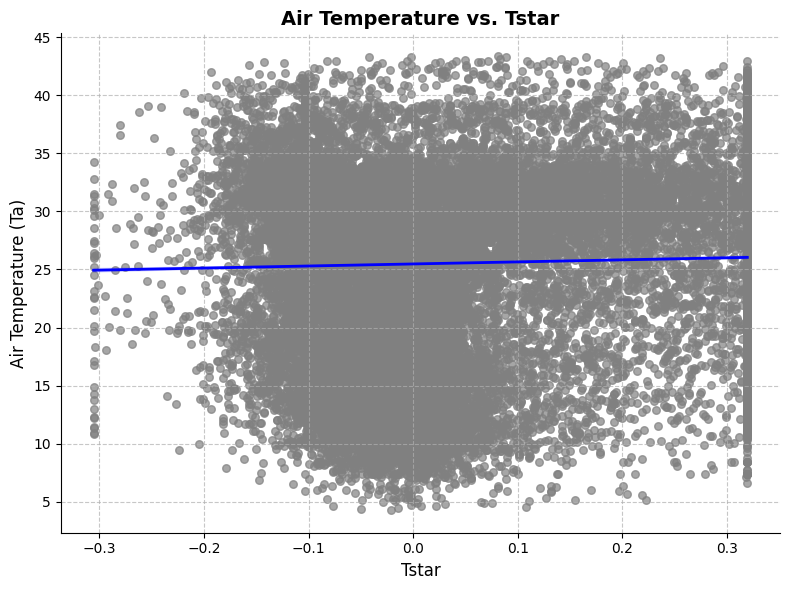

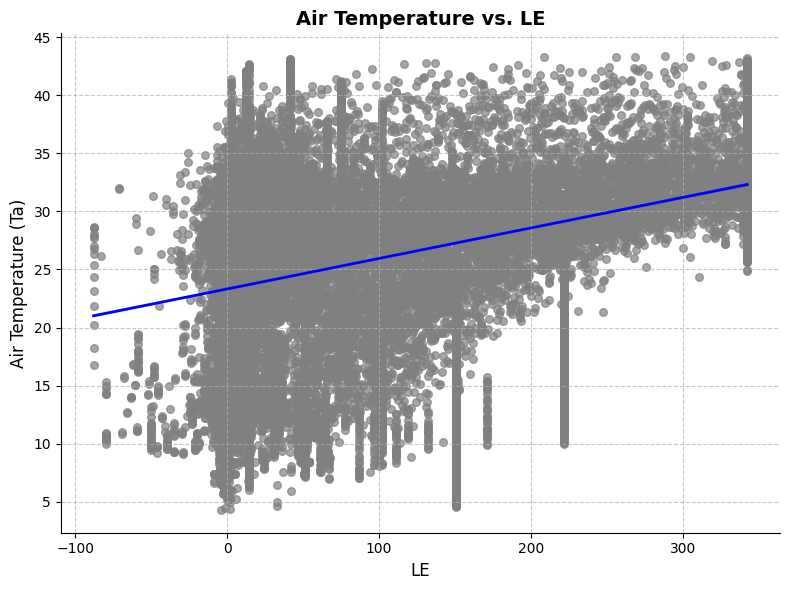

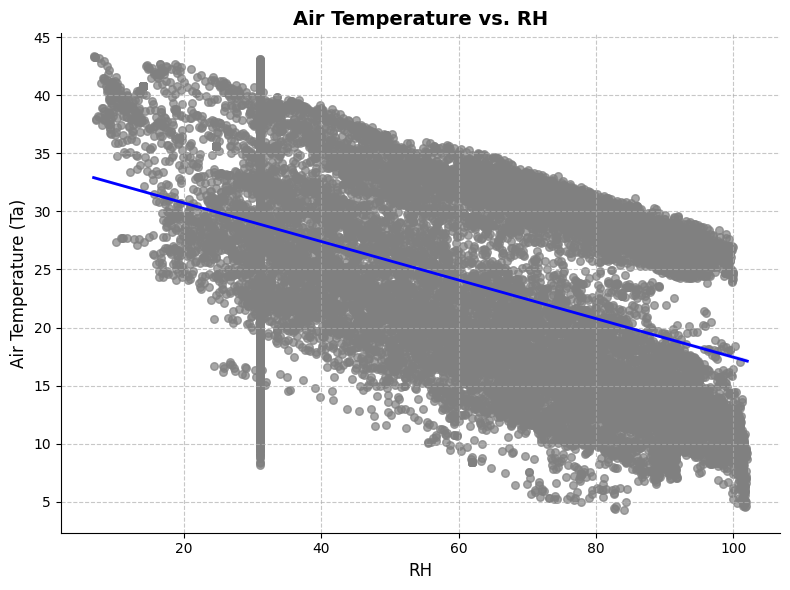

In [ ]:
# Select the columns for the scatter plots
x_cols = [col for col in df.columns if col not in ['DateTime', 'Ta',]]

# Create regplots for Ta vs. other variables
for col in x_cols:
    plt.figure(figsize=(8, 6))
    sns.regplot(x=col, y='Ta', data=df, scatter_kws={'alpha': 0.7, 's': 30, 'color':'grey'},
                line_kws={'color': 'blue', 'linewidth': 2})  # Use regplot for regression line

    plt.title(f'Air Temperature vs. {col}', fontsize=14, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Air Temperature (Ta)', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    sns.despine()
    plt.tight_layout()
    plt.show()

To check the distributions for each features we will plot a histogram

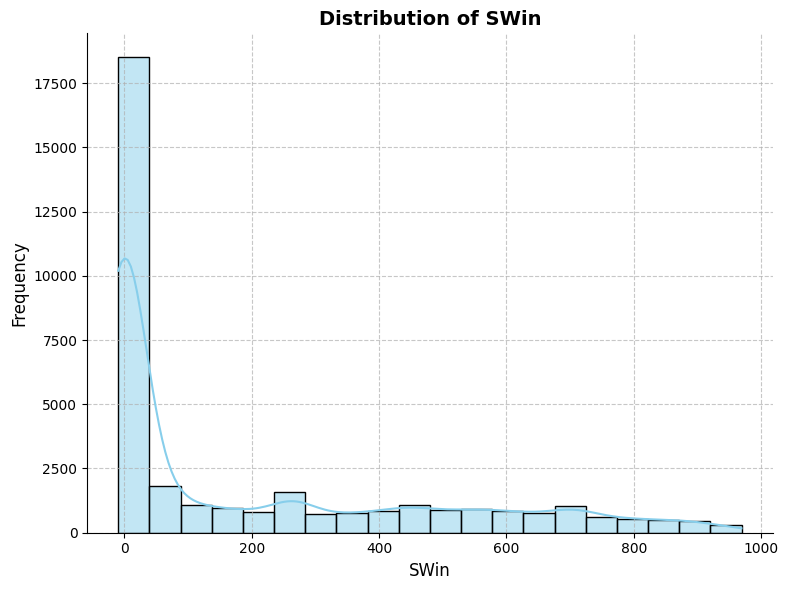

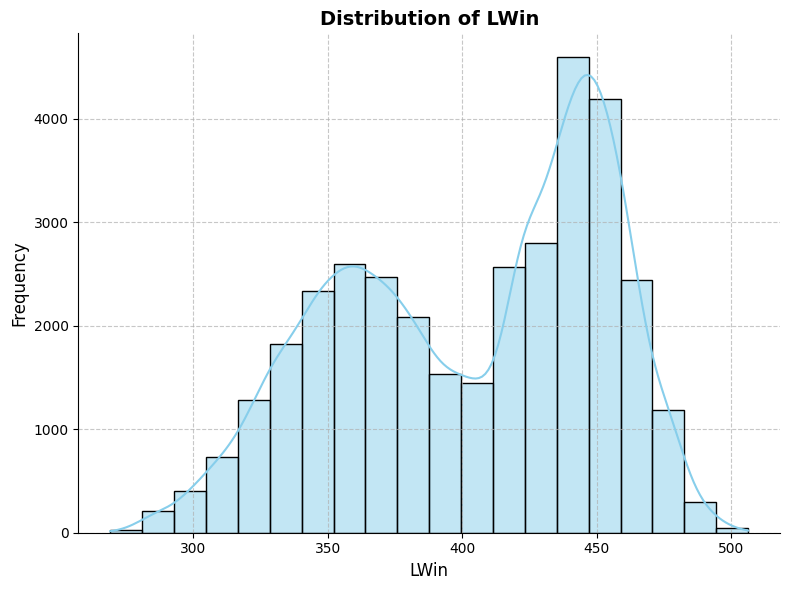

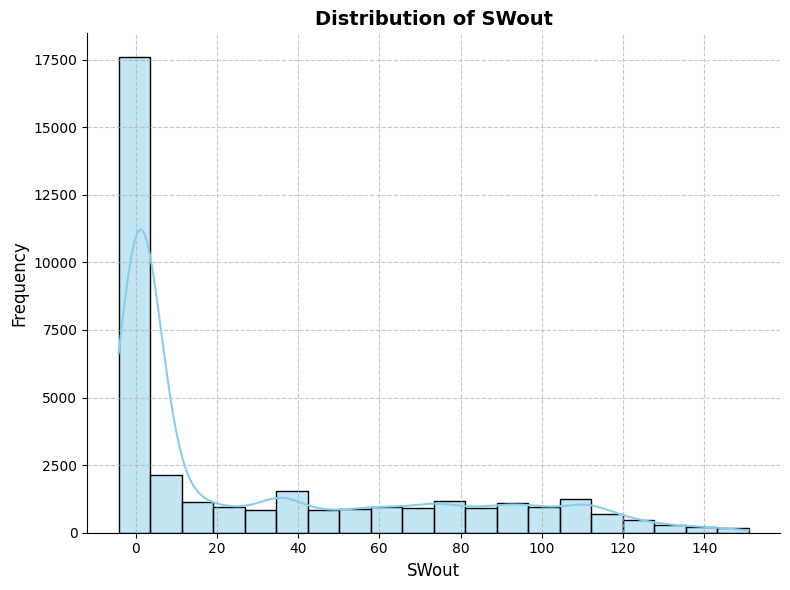

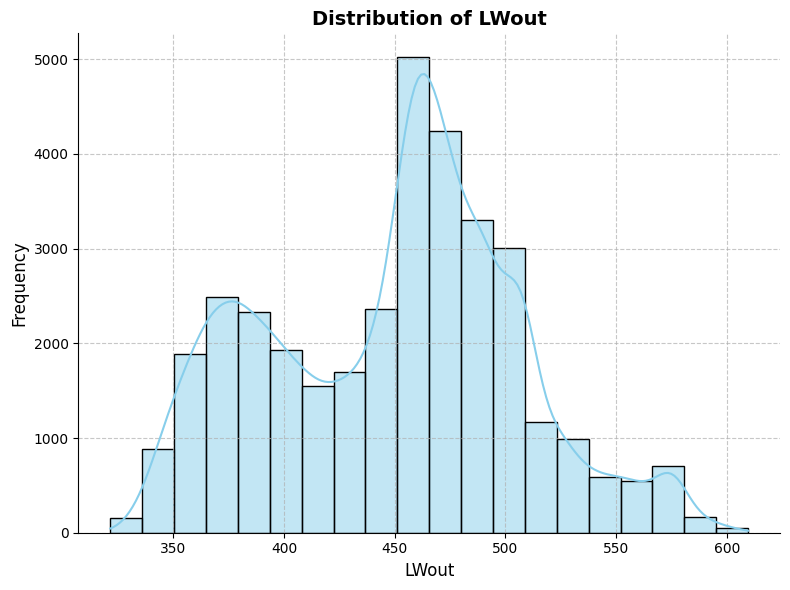

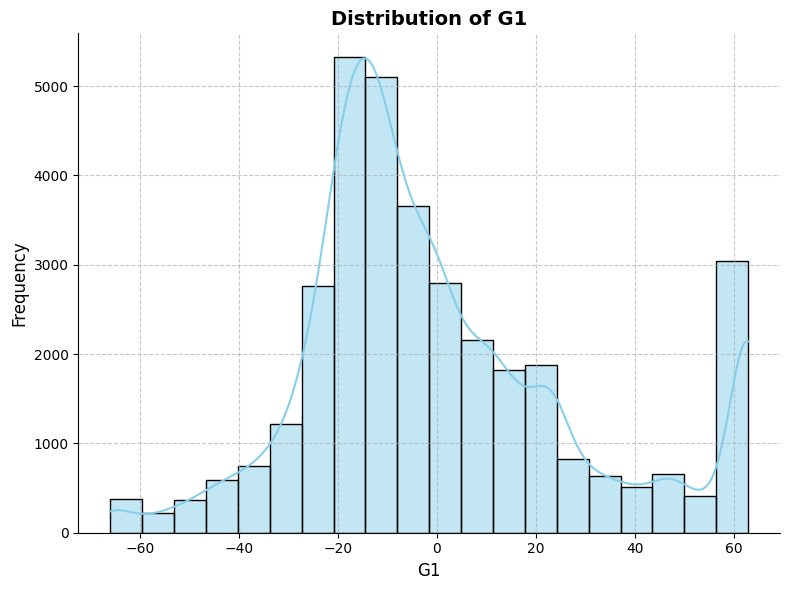

...

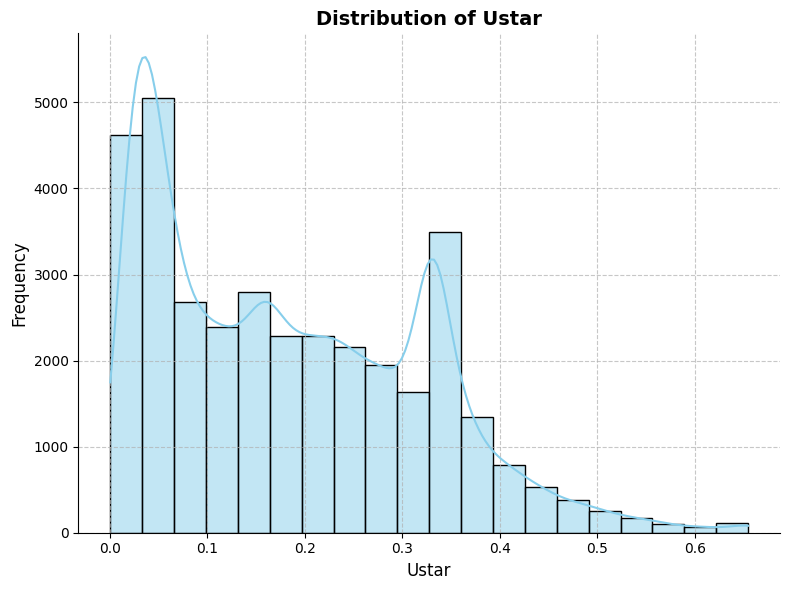

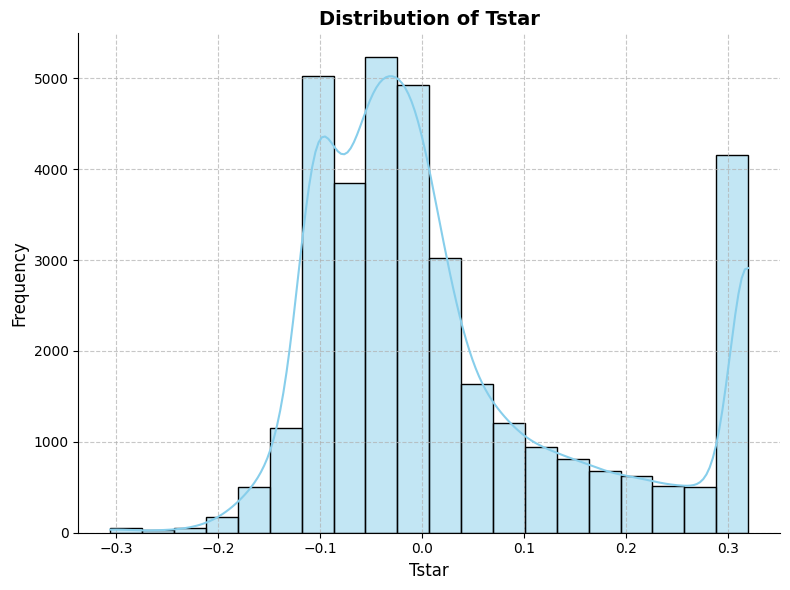

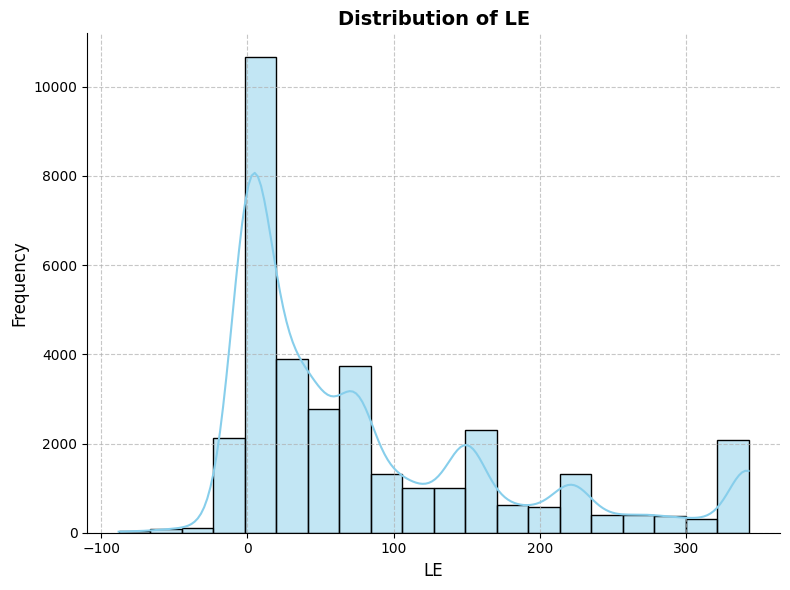

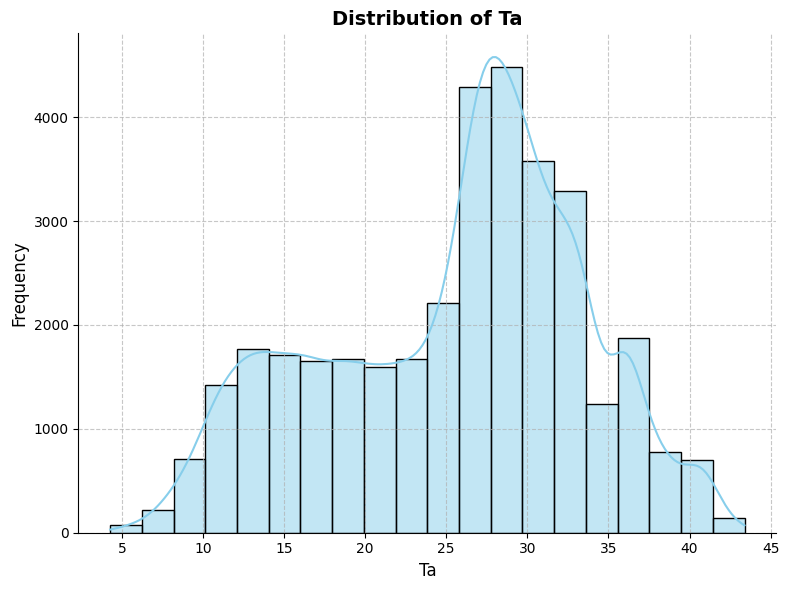

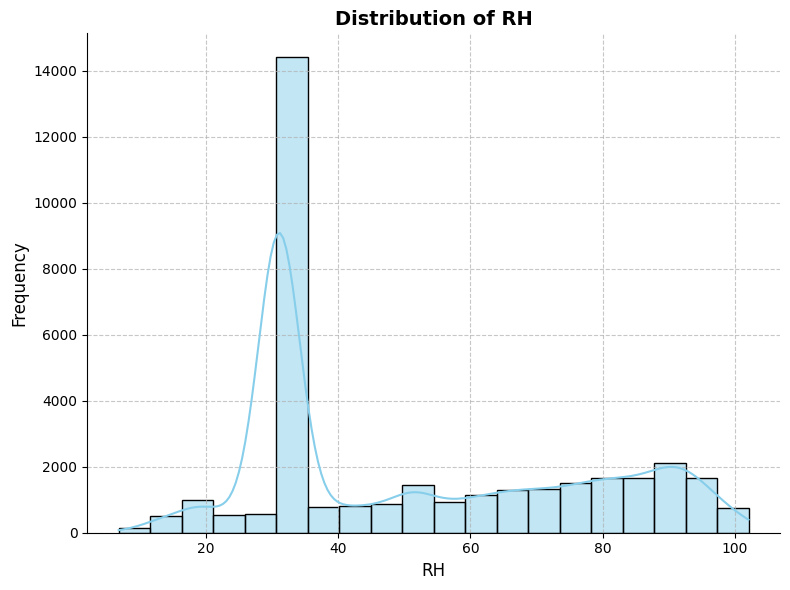

In [ ]:
# Select the columns for histograms
histogram_cols = df.select_dtypes(include=np.number).columns.tolist()  # Select numerical columns

# Create histograms for each feature
for col in histogram_cols:
    plt.figure(figsize=(8, 6))  # Adjust figure size if needed
    sns.histplot(df[col], bins=20, kde=True, color='skyblue')  # Create histogram with kernel density estimation
    plt.title(f'Distribution of {col}', fontsize=14, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    sns.despine()
    plt.tight_layout()
    plt.show()

Wind speed and direction can impact temperature and humidity. You can derive an interaction term between wind speed (WS_EC, WS_10m) and wind direction (WD_EC, WD_10m) to estimate the wind power.

In [ ]:
# Calculate Wind Power
def calculate_wind_power(WS_EC, WD_EC):
    return WS_EC**2 * WD_EC

# Apply function to create a new column 'Wind_Power'
df['Wind_Power'] = df.apply(lambda row: calculate_wind_power(row['WS_EC'], row['WD_EC']), axis=1)

# Check the new feature
df[['WS_EC', 'WD_EC', 'Wind_Power']].head()

,WS_EC,WD_EC,Wind_Power
0,0.3526,299.6254,37.251455
1,0.3695,315.0408,43.012599
2,0.5778,292.9007,97.785731
3,0.1305,187.6768,3.196183
4,0.3674,294.2858,39.723510


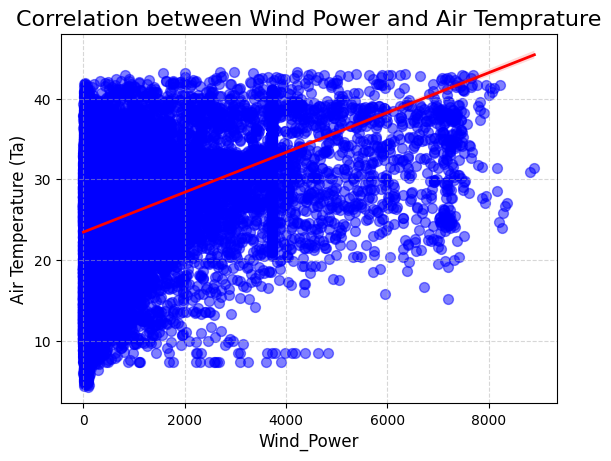

In [ ]:
sns.regplot(x='Wind_Power', y='Ta', data=df,
            scatter_kws={'color': 'blue', 'alpha': 0.5, 's': 50},  # Customize scatter points
            line_kws={'color': 'red', 'linewidth': 2})  # Customize regression line
plt.title('Correlation between Wind Power and Air Temprature', fontsize=16)
plt.xlabel('Wind_Power', fontsize=12)
plt.ylabel('Air Temperature (Ta)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)  # Add a grid for better readability
plt.show()

In [ ]:
columns_to_drop = ['WS_EC', 'WD_EC']
df = df.drop(columns=columns_to_drop)
df

,DateTime,SWin,LWin,SWout,LWout,G1,G2,Tsoil_0.05_1,Tsoil_0.05_2,Pa,VWC_0.05_1,Ustar,Tstar,LE,Ta,RH,Wind_Power
0,2016-01-01 00:30:00,-2.3061,355.5667,1.9582,374.6367,-5.7250,-37.1903,15.9820,16.5087,100.4467,42.0137,0.0439,-0.0426,150.5684,12.7556,97.9850,37.251455
1,2016-01-01 01:00:00,-2.7614,354.7433,1.6285,373.6833,-5.9796,-38.6615,15.8797,16.4643,100.4333,42.0527,0.0335,-0.0046,150.5684,12.1394,98.3706,43.012599
2,2016-01-01 01:30:00,-2.5296,355.2767,1.3944,373.6400,-5.8415,-39.0089,15.7683,16.4067,100.5000,42.0797,0.0654,-0.0236,150.5684,12.0261,98.6817,97.785731
3,2016-01-01 02:00:00,-2.8767,353.7600,1.4567,371.4967,-5.6001,-38.7332,15.6610,16.3640,100.5000,42.1123,0.0454,-0.0141,150.5684,11.2672,99.5878,3.196183
4,2016-01-01 02:30:00,-2.1375,353.0100,2.2068,370.8367,-5.5633,-38.4674,15.5517,16.3237,100.4967,42.1447,0.0808,-0.0541,150.5684,11.4194,100.0256,39.723510
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35083,2017-12-31 22:00:00,-0.2632,372.1967,0.0400,373.6967,-4.1578,-3.6959,14.2027,14.3450,100.0667,27.3123,0.2086,0.0371,1.9641,11.4972,100.9011,56.465830
35084,2017-12-31 22:30:00,-0.0592,372.0333,0.1823,373.3367,-4.5787,-3.8906,14.2167,14.3393,100.1000,27.3027,0.0938,-0.0050,1.9641,11.4594,100.9589,1.080250
35085,2017-12-31 23:00:00,-0.2008,372.0533,0.0869,373.3500,-4.8221,-4.1733,14.2213,14.3410,100.0333,27.2990,0.1287,0.0174,1.9641,11.4517,100.9489,132.595691
35086,2017-12-31 23:30:00,-0.1530,371.7133,0.1157,372.9867,-4.8834,-4.2705,14.2280,14.3373,100.0367,27.3000,0.1483,0.0199,1.9641,11.3867,100.9422,152.076883


**Now we can reduce more parameters in similar way by getting the difference of Shortwave and LongWave Radiations**

1. Net Shortwave Radiation('Net_SW'): 'SWin' - 'SWout'
2. Net Longwave Radiation('Net_LW'): 'LWin' - 'LWout'

In [ ]:
df['Net_SW'] = df['SWin'] - df['SWout']

# Drop the original columns
df = df.drop(columns=['SWin', 'SWout'])

In [ ]:
df['Net_LW'] = df['LWin'] - df['LWout']

# Drop the original columns
df = df.drop(columns=['LWin', 'LWout'])

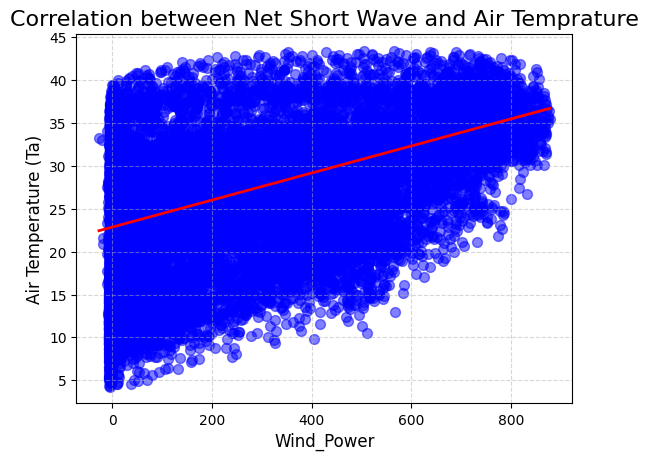

In [ ]:
sns.regplot(x='Net_SW', y='Ta', data=df,
            scatter_kws={'color': 'blue', 'alpha': 0.5, 's': 50},  # Customize scatter points
            line_kws={'color': 'red', 'linewidth': 2})  # Customize regression line
plt.title('Correlation between Net Short Wave and Air Temprature', fontsize=16)
plt.xlabel('Wind_Power', fontsize=12)
plt.ylabel('Air Temperature (Ta)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)  # Add a grid for better readability
plt.show()

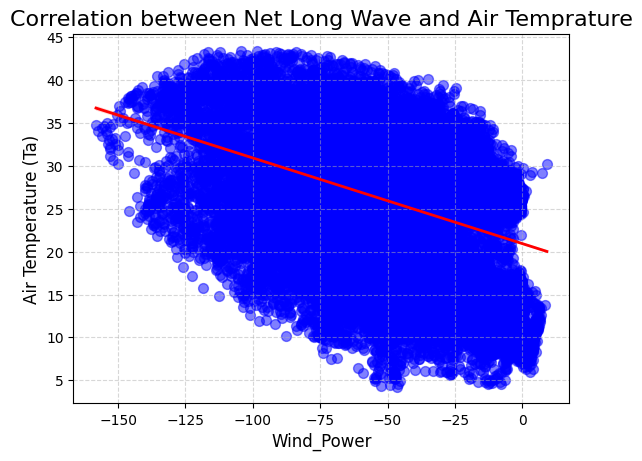

In [ ]:
sns.regplot(x='Net_LW', y='Ta', data=df,
            scatter_kws={'color': 'blue', 'alpha': 0.5, 's': 50},  # Customize scatter points
            line_kws={'color': 'red', 'linewidth': 2})  # Customize regression line
plt.title('Correlation between Net Long Wave and Air Temprature', fontsize=16)
plt.xlabel('Wind_Power', fontsize=12)
plt.ylabel('Air Temperature (Ta)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)  # Add a grid for better readability
plt.show()

In [ ]:
df

,DateTime,G1,G2,Tsoil_0.05_1,Tsoil_0.05_2,Pa,VWC_0.05_1,Ustar,Tstar,LE,Ta,RH,Wind_Power,Net_SW,Net_LW
0,2016-01-01 00:30:00,-5.7250,-37.1903,15.9820,16.5087,100.4467,42.0137,0.0439,-0.0426,150.5684,12.7556,97.9850,37.251455,-4.2643,-19.0700
1,2016-01-01 01:00:00,-5.9796,-38.6615,15.8797,16.4643,100.4333,42.0527,0.0335,-0.0046,150.5684,12.1394,98.3706,43.012599,-4.3899,-18.9400
2,2016-01-01 01:30:00,-5.8415,-39.0089,15.7683,16.4067,100.5000,42.0797,0.0654,-0.0236,150.5684,12.0261,98.6817,97.785731,-3.9240,-18.3633
3,2016-01-01 02:00:00,-5.6001,-38.7332,15.6610,16.3640,100.5000,42.1123,0.0454,-0.0141,150.5684,11.2672,99.5878,3.196183,-4.3334,-17.7367
4,2016-01-01 02:30:00,-5.5633,-38.4674,15.5517,16.3237,100.4967,42.1447,0.0808,-0.0541,150.5684,11.4194,100.0256,39.723510,-4.3443,-17.8267
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35083,2017-12-31 22:00:00,-4.1578,-3.6959,14.2027,14.3450,100.0667,27.3123,0.2086,0.0371,1.9641,11.4972,100.9011,56.465830,-0.3032,-1.5000
35084,2017-12-31 22:30:00,-4.5787,-3.8906,14.2167,14.3393,100.1000,27.3027,0.0938,-0.0050,1.9641,11.4594,100.9589,1.080250,-0.2415,-1.3034
35085,2017-12-31 23:00:00,-4.8221,-4.1733,14.2213,14.3410,100.0333,27.2990,0.1287,0.0174,1.9641,11.4517,100.9489,132.595691,-0.2877,-1.2967
35086,2017-12-31 23:30:00,-4.8834,-4.2705,14.2280,14.3373,100.0367,27.3000,0.1483,0.0199,1.9641,11.3867,100.9422,152.076883,-0.2687,-1.2734


Add Categorical Columns for sesonal and day/night variations

In [ ]:
# Convert 'DateTime' to pandas datetime
df['DateTime'] = pd.to_datetime(df['DateTime'], format='%Y-%m-%d %H:%M')

#Add Day/Night column based on the hour of the day (6 AM to 6 PM is considered day)
def classify_day_night(hour):
    if 6 <= hour < 18:
        return 'Day'
    else:
        return 'Night'

df['Day_Night'] = df['DateTime'].dt.hour.apply(classify_day_night)

# 2. Add Season column based on the month of the year
def classify_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

df['Season'] = df['DateTime'].dt.month.apply(classify_season)

# Check the new features
df[['DateTime', 'Day_Night', 'Season']].head()

,DateTime,Day_Night,Season
0,2016-01-01 00:30:00,Night,Winter
1,2016-01-01 01:00:00,Night,Winter
2,2016-01-01 01:30:00,Night,Winter
3,2016-01-01 02:00:00,Night,Winter
4,2016-01-01 02:30:00,Night,Winter


In [ ]:
df

,DateTime,G1,G2,Tsoil_0.05_1,Tsoil_0.05_2,Pa,VWC_0.05_1,Ustar,Tstar,LE,Ta,RH,Wind_Power,Net_SW,Net_LW,Day_Night,Season
0,2016-01-01 00:30:00,-5.7250,-37.1903,15.9820,16.5087,100.4467,42.0137,0.0439,-0.0426,150.5684,12.7556,97.9850,37.251455,-4.2643,-19.0700,Night,Winter
1,2016-01-01 01:00:00,-5.9796,-38.6615,15.8797,16.4643,100.4333,42.0527,0.0335,-0.0046,150.5684,12.1394,98.3706,43.012599,-4.3899,-18.9400,Night,Winter
2,2016-01-01 01:30:00,-5.8415,-39.0089,15.7683,16.4067,100.5000,42.0797,0.0654,-0.0236,150.5684,12.0261,98.6817,97.785731,-3.9240,-18.3633,Night,Winter
3,2016-01-01 02:00:00,-5.6001,-38.7332,15.6610,16.3640,100.5000,42.1123,0.0454,-0.0141,150.5684,11.2672,99.5878,3.196183,-4.3334,-17.7367,Night,Winter
4,2016-01-01 02:30:00,-5.5633,-38.4674,15.5517,16.3237,100.4967,42.1447,0.0808,-0.0541,150.5684,11.4194,100.0256,39.723510,-4.3443,-17.8267,Night,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35083,2017-12-31 22:00:00,-4.1578,-3.6959,14.2027,14.3450,100.0667,27.3123,0.2086,0.0371,1.9641,11.4972,100.9011,56.465830,-0.3032,-1.5000,Night,Winter
35084,2017-12-31 22:30:00,-4.5787,-3.8906,14.2167,14.3393,100.1000,27.3027,0.0938,-0.0050,1.9641,11.4594,100.9589,1.080250,-0.2415,-1.3034,Night,Winter
35085,2017-12-31 23:00:00,-4.8221,-4.1733,14.2213,14.3410,100.0333,27.2990,0.1287,0.0174,1.9641,11.4517,100.9489,132.595691,-0.2877,-1.2967,Night,Winter
35086,2017-12-31 23:30:00,-4.8834,-4.2705,14.2280,14.3373,100.0367,27.3000,0.1483,0.0199,1.9641,11.3867,100.9422,152.076883,-0.2687,-1.2734,Night,Winter


A violin plot combines aspects of a box plot and a density plot, showing the distribution of the data and its probability density. It provides a better view of the distribution and skewness of Ta and RH across categories. This will help us in determining that if it's useful to add categorical cloumns

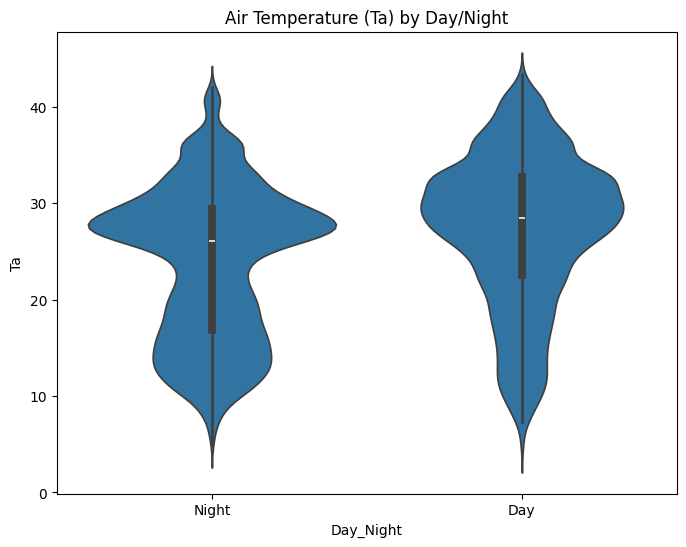

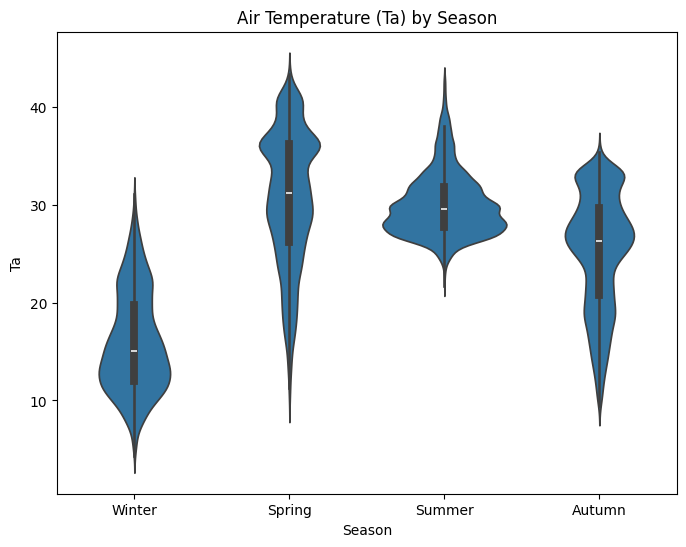

In [ ]:
# Violin plot for Ta by Day/Night
plt.figure(figsize=(8, 6))
sns.violinplot(x='Day_Night', y='Ta', data=df)
plt.title('Air Temperature (Ta) by Day/Night')
plt.show()

# Violin plot for Ta by Season
plt.figure(figsize=(8, 6))
sns.violinplot(x='Season', y='Ta', data=df)
plt.title('Air Temperature (Ta) by Season')
plt.show()


# Dimensionality Reduction and Model Training

In [ ]:
# Columns to encode
categorical_columns = ['Day_Night', 'Season']

# Columns to scale (numerical features)
numerical_columns = ['Net_SW', 'Net_LW', 'G1', 'G2', 'Tsoil_0.05_1',
                     'Tsoil_0.05_2', 'Pa', 'VWC_0.05_1',
                     'Ustar', 'Tstar', 'LE','RH','Wind_Power']

# Separate features and target variable (Ta and RH)
X = df.drop(columns=['Ta', 'DateTime'])  # Drop target variables and DateTime
y = df[['Ta']]

# Preprocessing pipeline for both numerical and categorical features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_columns),
        ('cat', OneHotEncoder(), categorical_columns)
    ])

# Apply PCA
pca = PCA(n_components=7)

# Combine preprocessor and PCA in a pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('pca', pca)
])

# Fit the pipeline on the data
X_transformed = pipeline.fit_transform(X)

# The transformed data after PCA
transformed_df = pd.DataFrame(X_transformed, columns=[f'PC{i+1}' for i in range(X_transformed.shape[1])])

# Display the transformed features (PCA components)
transformed_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,-3.279658,-2.118623,0.915993,0.908147,-0.830622,-0.222978,-1.054357
1,-3.287485,-2.213112,0.993583,0.802352,-0.912301,-0.216196,-0.907788
2,-3.260849,-2.219052,0.941224,1.007417,-0.910446,-0.226061,-0.898955
3,-3.324172,-2.260553,0.985739,0.875959,-0.918831,-0.186172,-0.928877
4,-3.293317,-2.170063,0.922810,1.126876,-0.873063,-0.201875,-1.002305


# Model Training and Prediction

In [ ]:
# Split the transformed data (principal components) into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(transformed_df, y, test_size=0.2, random_state=42)

# Initialize the models
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'Support Vector Regression': SVR()
}

# Function to evaluate models
def evaluate_model(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Calculate evaluation metrics
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mse)

    return mae, mse, r2, rmse

# Store results for each model
results = {}

# Loop through each model and evaluate its performance
for model_name, model in models.items():
    mae, mse, r2, rmse = evaluate_model(model, X_train, X_test, y_train, y_test)
    results[model_name] = {'MAE': mae, 'MSE': mse, 'R2': r2, 'RMSE': rmse}

# Display the evaluation results
results_df = pd.DataFrame(results).T
print(results_df)

                                MAE       MSE        R2      RMSE
Linear Regression          1.923738  5.686760  0.908785  2.384693
Random Forest              0.805801  1.412486  0.977344  1.188480
Gradient Boosting          1.347791  3.310910  0.946893  1.819591
Support Vector Regression  0.992213  1.946833  0.968773  1.395290


**Export and Save the Trained model**

In [ ]:
model_to_export = models['Random Forest']

In [ ]:
joblib.dump(model_to_export, 'random_forest_model.pkl')

['random_forest_model.pkl']

# Thank You